In [1]:
import numpy as np
from glob import glob
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle
from skimage import io, measure
from skimage.registration import phase_cross_correlation
from skimage.transform import AffineTransform, warp
from skimage.measure import regionprops
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
from matplotlib.colors import to_rgba
from scipy import signal
from scipy.optimize import curve_fit
import napari
import cmocean.cm as cmo
import random
import gc
import time

In [2]:
# dat = np.load(r"C:\Users\Urs\Documents/remote_focusing_manuscript/20220418/rec09/volpy_3D_rec09_results.npy", allow_pickle=True)[()]
# dat = np.load(r"C:\Users\Urs\Documents/remote_focusing_manuscript/volpy_3D_results.npy", allow_pickle=True)[()]
# dat = np.load(r"C:\Users\Urs\Documents/remote_focusing_manuscript/20220418/rec06/volpy_3D_rec06_results.npy", allow_pickle=True)[()]
dat = np.load(r"C:\Users\Urs\Documents/remote_focusing_manuscript/20230425/rec03/volpy_3D_results.npy", allow_pickle=True)[()]

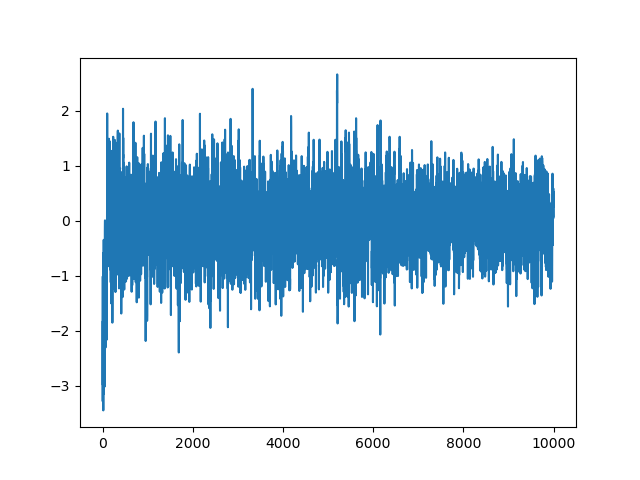

In [3]:
%matplotlib widget
plt.plot(dat[0]['rawROI']['ts'])
# dat[0]['rawROI'].keys()

In [50]:
# f,a = plt.subplots()
# a.plot(dat[1]['F0']+dat[1]['dFF'])
# dat[0]['rawROI']['dFF']
# dat[0].keys()
# a = np.array([1,2,3,4,5])
# b = np.array([4,2])
# np.setdiff1d(a, b)
# dffsort_rec09 = np.copy(dffsort)
# dffsort_rec01 = np.copy(dffsort)
# dffsort_rec06 = np.copy(dffsort)

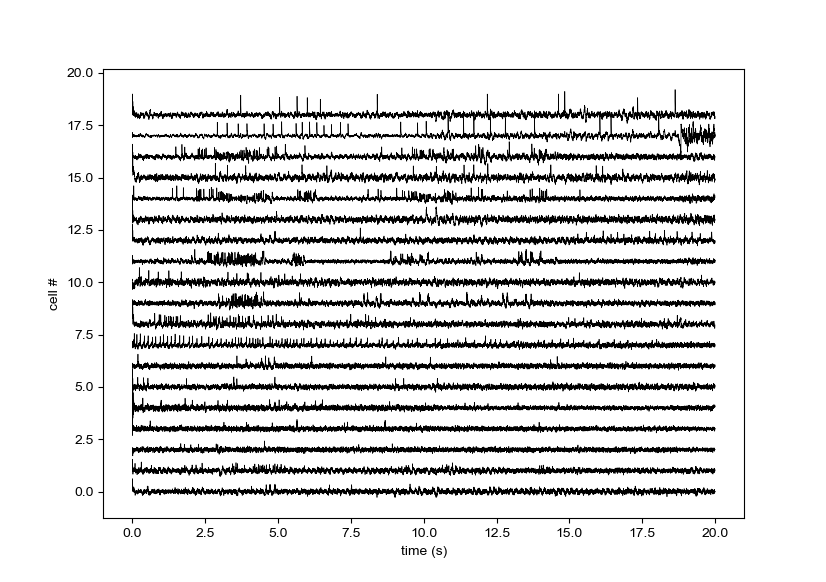

In [29]:
%matplotlib widget
centi=1/2.54
# plot time traces of all ROIs scaled by std
# rec01
man_take_out_after_sort = np.array([287, 284,282,281,280,279,278,277,276,274,272,267,266,265,263,260,259,253,252,251,249,
                                    247,246,244,243,242,241,236,235,234,228,227,225,223,222,220,218,216,212,207,206,205,202,
                                    199,193,190,189,188,186,185,183,182,179,178,175,174,173,172,171,170,169,
168,164,162,158,157,155,154,152,150,149,148,147,146,144,142,140,138,136,135,134,131,129,124,122,
                                    118,115,114,109,108,106,105,102,101,100,
99,95,94,91,90,89,87,86,85,84,83,81,80,79,78,77,76,73,70,67,65,64,63,61,60,59,58,57,56,55,54,53,52,51,50,
48,47,46,45,44,43,42,41,40,39,36,34,33,32,31,30,28,27,26,25,24,23,22,21,20,19,18,17,16,15,14,13,12,11,10,
9,8,7,6,5,4,3,2,1,0])
#rec 06
# man_take_out_after_sort = np.array([0,1,2,3,4,5,6,7,8,10,11,12,13,14,15,16,26,27,28,29,30,31])
# #rec09
# keep_after_sort = np.array([277,269,267,256,243,237,236,227,226,225,221,219,217,215,213,212,210,209,
#                            182,180,183,173,169,155,153,106,94,81])
# man_take_out_after_sort = np.arange(dat.shape[0])
# man_take_out_after_sort = np.setdiff1d(man_take_out_after_sort, keep_after_sort)
keep_after_sort = np.array([204, 214, 239,254,264,274,278,289,293,294,296,300,303,306,312,324,327,363,372])
man_take_out_after_sort = np.arange(dat.shape[0])
man_take_out_after_sort = np.setdiff1d(man_take_out_after_sort, keep_after_sort)

%matplotlib widget
cmap = plt.get_cmap('tab10')
cmaplist = [cmap(i) for i in range(cmap.N)]
# f, a = plt.subplots(figsize=(20,30))
f,a = plt.subplots(figsize=(21*centi,14.8*centi))
# snr_idx = [d['snr'] for d in dat]
# snr_idx = np.argsort(snr_idx)
# print(snr_idx)
xax = np.arange(0,np.shape(dat[0]['dFF'])[0]/500, 1/500)
# dffs = []
# for n, d in enumerate(dat):
#     # col = cmaplist[np.mod(n, len(cmaplist))][0:3]
#     if d:
#         col = 'k'
#         # col = 'k' if d['locality'] else 'gray'
#         # a.plot(xax,d['dFF']/np.std(d['dFF']) + d['cell_n']*15, c=col, linewidth=1)
#         dff = d['dFF'] - signal.medfilt(d['dFF'], 101)
#         # dff = d['dFF'] - signal.medfilt(d['dFF'], 9)
#         # dff -= np.quantile(dff, .001)
#         # dff /= np.quantile(dff, .999)
#         # dff -= np.min(dff[500:])
#         # dff /= np.max(dff[500:])
#         # dff = (dff - np.mean(dff))/np.std(dff[250:750]-signal.medfilt(dff[250:750], 9))
#         dff = (dff - np.mean(dff))/np.std(dff[250:]-signal.medfilt(dff[250:], 9))
#         dffs.append(dff)
#         # a.plot(xax,dff*15 + d['cell_n']*15, c=col, linewidth=1)
#         # a.text(10, d['cell_n']*15, str(n))
# stds = [np.max(d[500:]) for d in dffs]


        

#sort by y position
# stds = []
# for d in dat:
#     cnt = 0
#     tmpx = 0
#     for k in range(16):
#         xv = d['context_coord']['corner'][k][1]
#         if not xv==0:
#             tmpx = tmpx+xv
#             cnt +=1
#     stds.append(tmpx/cnt)
        

pos = np.argsort(stds)

z_pos = [np.unravel_index(np.argmax(d['weights'][:,:,:]),d['weights'].shape)[0] for d in dat]
z_pos = [(a-15)*-1 if a>7 else a for a in z_pos]
z_pos = np.argsort(z_pos)
y_pos = [np.unravel_index(np.argmax(d['weights'][:,:,:]),d['weights'].shape)[2] for d in dat]

# pos = np.arange(len(pos))
dffsort = [dffs[pos[n]] for n in range(len(pos)-1,-1,-1) if not np.any(man_take_out_after_sort==n)]
# one_side_dff = [dffs[n] for n in range(len(pos)-1, -1, -1) if not np.any(man_take_out_after_sort==n) and y_pos[n] > 61]
dffsort = [d['F0'] for n,d in enumerate(dat) if not np.any(man_take_out_after_sort==n)]
dffsort = np.asarray(dffsort).transpose()[2000:,:]
# dffsort /= np.mean(dffsort,axis=0)
dffsort /= np.mean(dffsort[:100,:], axis=0)
# a.plot(xax[:dffsort.shape[0]],dffsort)
# a.plot(xax[:dffsort.shape[0]],np.mean(dffsort, axis=1), c='k', linewidth=2)
# mp = a.imshow(np.asarray(dffsort), vmin=0, vmax=10, extent=(0,20,0,len(dffsort)), cmap='magma', aspect=.1)
# f.colorbar(mp, ax=a, extend='max', shrink=.65, label = 'fluorescence (sigma)')

inc = 0
for n in range(len(stds)):
    if not np.any(man_take_out_after_sort==n) and not d==False:
#         # a.plot(xax,dat[pos[n]]['dFF']*12 + len(stds) - n, c=col, linewidth=.5)
#         # a.plot(xax,(dat[pos[n]]['dFF'] - signal.medfilt(dat[pos[n]]['dFF'], 9))*12 + len(stds) - n, c=col, linewidth=1)
        # a.plot(xax,dat[pos[n]]['rawROI']['dFF']*12 + len(stds) - n, c=col, linewidth=1)
        a.plot(xax,dffs[pos[n]]/20 + inc, c='k', linewidth=.5)
#         a.text(1, inc, str(n), c='red', size=5)
        
#         # a.plot(xax,dat[pos[n]]['dFF']*12 + len(stds) - n, c='red', linewidth=.5)
        
#     # a.plot(xax,d['t']/np.std(d['t']) + d['cell_n']*15, c=col, linewidth=0.8)
#     # a.plot(d['dFF'] + snr_idx[n]/10, c=col, linewidth=0.8)
#         a.eventplot(xax[dat[pos[n]]['spikes']], lineoffset=inc, linelength=.5, linewidth=.8, colors='r') 
        inc += 1

# a.set_xlim((14, 16))
a.set_xlabel('time (s)')
a.set_ylabel('cell #')
# a.plot(xax[[5822, 5822]],[0, 120], c='r', linewidth=.5)
# a.get_yaxis().set_visible(False)
# a.xaxis.label.set_size(30)
# a.tick_params(axis='x', labelsize=30)
# a.margins(x=0, y=0)
    # a.set(frame_on=False)
image_format = 'png' # e.g .png, .svg, etc.
# image_name = r'H:\traces.png'

# f.savefig(image_name, format=image_format, bbox_inches='tight', dpi=600)
# f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\figS3_all_traces\all_traces_heatmap.svg', format="svg")

In [22]:
# dffsort = [d['F0'] for n,d in enumerate(dat) if not np.any(man_take_out_after_sort==n)]
dffsort = []
for n,d in enumerate(dat):
    if not np.any(man_take_out_after_sort==n):
        dffsort.append(d['F0'])

TypeError: 'bool' object is not subscriptable

In [27]:
dat[352]

False

In [59]:
# measure cells size
# dat[0]
# masks_3d = np.load(r"C:\Users\Urs\Documents/remote_focusing_manuscript\y_shift_stack_seg.npy", allow_pickle=True)
# mask = masks_3d[()]['masks']
ps = regionprops(mask)
# f,a  = plt.subplots()
# a.imshow(mask[3,:,:])
msize = []
for n in range(np.max(mask)):
    if not np.any(man_take_out_after_sort==n):
        ms = np.zeros(16)
        for k in range(16):
            tmpm = np.where(mask[k,:,:]==n, 1, 0)
            if np.sum(tmpm) > 0:
                ps = regionprops(tmpm)
                ms[k] = ps[0].equivalent_diameter_area
        msize.append(np.max(ms))
print(len(msize))
print(np.asarray(msize)*6.5/16)
print(str(np.mean(np.asarray(msize)*6.5/16)) + ' ± ' + str(np.std(np.asarray(msize)*6.5/16)/np.sqrt(len(msize))))

114
[ 5.59553437  9.3384002   8.62482048  8.40268479  6.96713817  6.81466592
  7.60177096  7.96621282  7.04213643  7.29136256  9.39448719  5.59553437
  2.19842853  6.8607634   8.75779682  9.34964451  4.49142394  8.79371412
  6.11587266  8.44011341  7.84661318  7.01223338  7.01223338  7.87334789
  9.2819743   5.79840338  8.04495819 11.21919882  7.54628284  1.94484362
 10.93464194  4.20134239  9.84235207  8.28938498  3.46087458  9.47245107
  5.42390971  8.12294022  8.00568233  8.35251906  9.68090287 10.58307899
  3.99627374  8.08404324  7.18978638  8.09702966  9.58272779  6.09866905
  7.40574386  9.09906032  8.62482048  6.8607634   8.40268479  7.54628284
  8.18735789 10.26047098  6.16719557  5.10457132 10.53332282  4.89441577
  9.2138071   9.7565783   9.3384002   9.50566842  9.05275437  8.55141642
  8.63699384  7.71154951  4.69724359  7.05704044  9.84235207  9.07593688
  6.67446352 10.01169528 11.73191974  4.89441577  5.481715    5.74378612
  7.56019305  7.23349369  8.64915006  8.7457916

In [56]:
mask.shape

(16, 146, 1000)

tau:  [72.24177104]


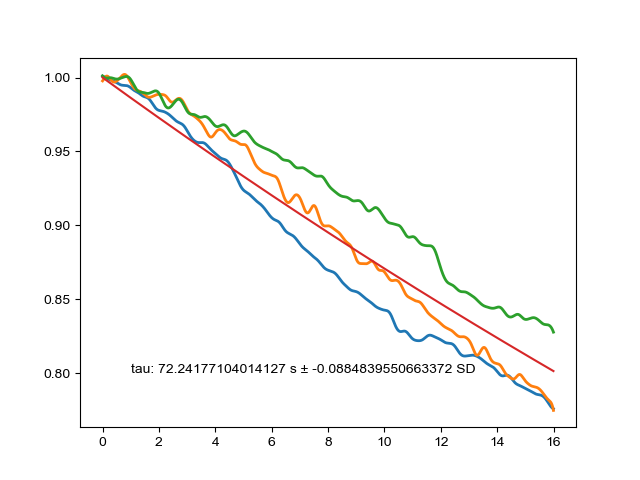

In [131]:
f,a = plt.subplots()
a.plot(xax[:dffsort.shape[0]],np.mean(dffsort_rec01, axis=1), linewidth=2)
a.plot(xax[:dffsort.shape[0]],np.mean(dffsort_rec06, axis=1), linewidth=2)
a.plot(xax[:dffsort.shape[0]],np.mean(dffsort_rec09, axis=1), linewidth=2)
x = np.hstack((xax[:dffsort.shape[0]],xax[:dffsort.shape[0]],xax[:dffsort.shape[0]]))
y = np.hstack((np.mean(dffsort_rec01, axis=1), np.mean(dffsort_rec06, axis=1), np.mean(dffsort_rec09, axis=1)))

guess = [-.01]

exp_decay = lambda x, t: np.exp(x * t)

params, cov = curve_fit(exp_decay, x, y, p0=guess)
print('tau: ', -1/params)
plt.plot(xax[:dffsort.shape[0]],exp_decay(xax[:dffsort.shape[0]], params[0]))
t = -1/params[0]
sdt = np.sqrt(np.diag(cov))[0]
sdt = sdt/params[0]
sdt = sdt*t
plt.text(1,0.8, 'tau: ' + str(t) + ' s ± ' + str(sdt) + ' SD')
# a.set_ylim((0,1))
f.savefig(r"C:\Users\Urs\Documents/remote_focusing_manuscript/decay_panel.svg", format="svg")

In [91]:
cov

array([[2.87458739e-10]])

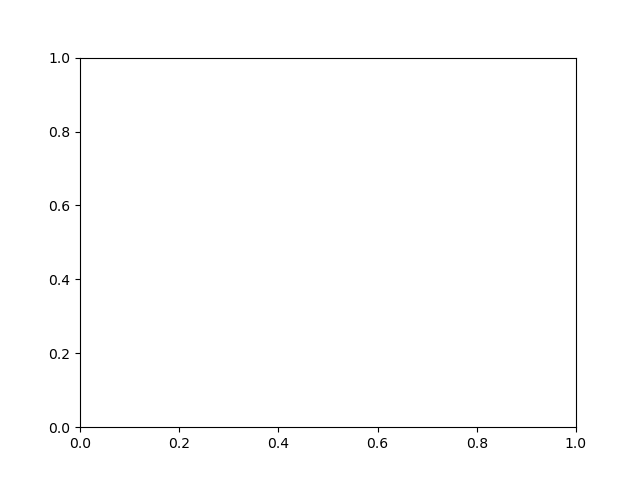

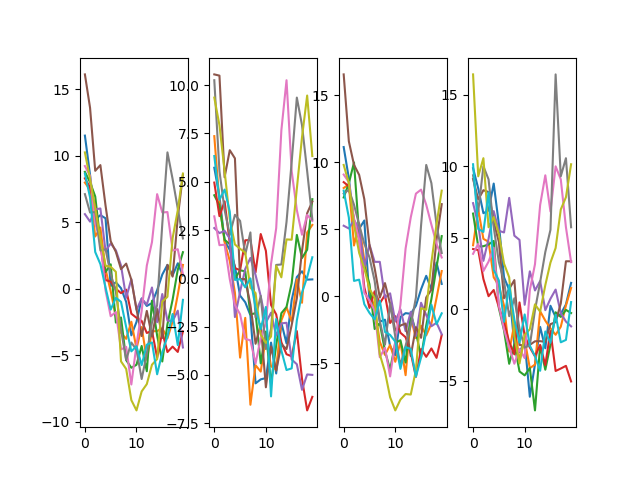

In [51]:
stds = [np.std(d[6000:8000]) for d in one_side_dff]
pos = np.argsort(stds)

f,a = plt.subplots()
# for n, d in enumerate(one_side_dff):
#     a.plot(d/40 + n, c='k', linewidth=.5)
# a.plot(np.vstack(one_side_dff).T);
# a.plot((np.vstack([one_side_dff[pos[d]] for d in range(10)]).T))
# a.plot((np.vstack([one_side_dff[pos[d]] for d in range(10-1,-1,-1)]).T))
ref_sig = np.mean(np.vstack(one_side_dff).T[:,[31,32,34,35]],1)
ref_peaks = [5822, 5844, 5866, 5888, 5921, 7116, 7136, 7150, 7166, 7185]
# a.plot(ref_sig)
# a.scatter(ref_peaks, ref_sig[ref_peaks],c='r')
# print(np.diff(ref_peaks))
f,b = plt.subplots(1,4)
raw_sig = np.vstack(one_side_dff).T[:,[31,32,34,35]]
for n, ax in enumerate(b):
    for p in ref_peaks:
        ax.plot(raw_sig[p:p+20, n])

take out neurons:
280, 276, 267, 252, 251, 243, 241, 236, 235, 223, 222, 212, 205, 199, 186, 178, 174,173,172,171,
168,162,158,157,154,152,150,146,144,138,136,135,134,131, 118,115,109,108,106,105,102,101,100,
95,94,91,90,89,87,86,85,84,83,81,79,78,77,73,70,67,65,64,63,61,60,59,58,57,55,54,53,52,51,50,
48,47,45,44,43,42,41,40,39,36,34,33,32,31,30,28,27,26,25,24,23,21,20,19,18,17,16,15,14,13,12,11,10,
9,8,7,6,5,4,3,2,1,0

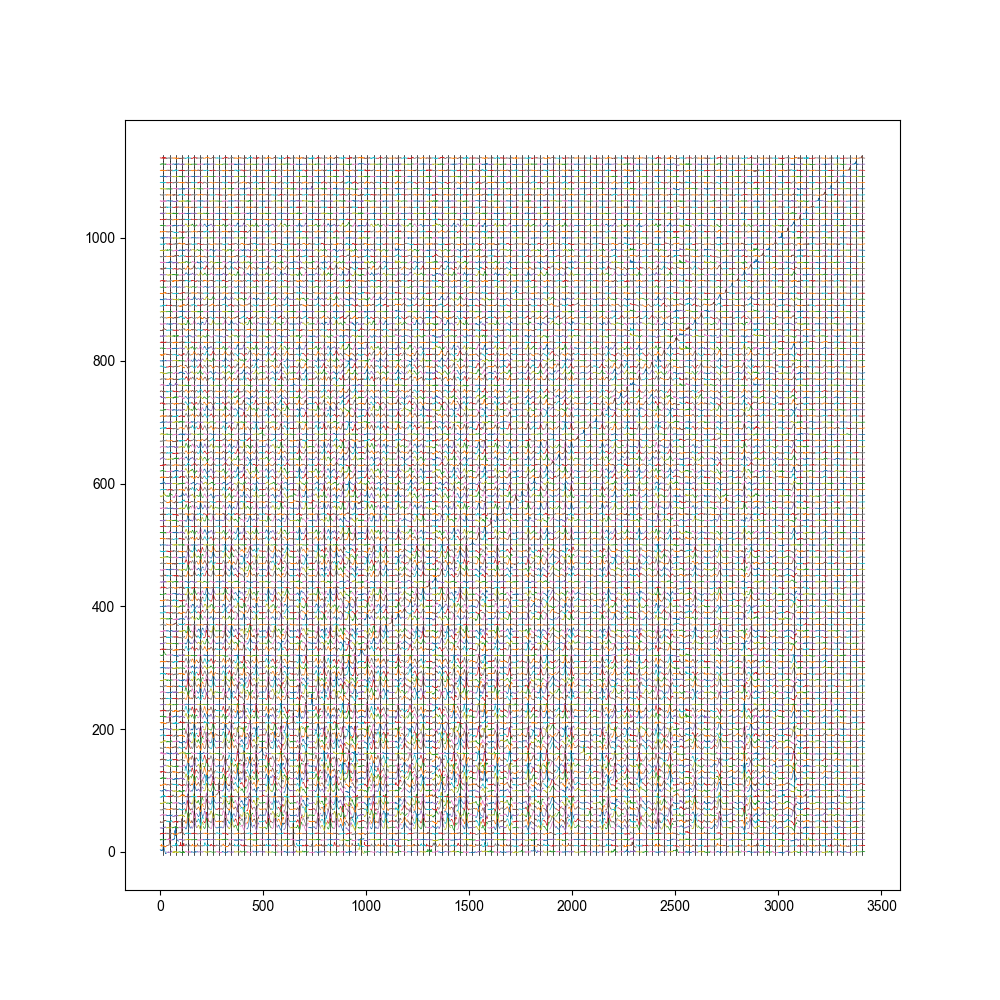

In [706]:
%matplotlib widget
traces = np.zeros((len(xax), inc))
spikes = []
inc2 = 0
for n in range(len(stds)):
    if not np.any(man_take_out_after_sort==n):
        traces[:,inc2] = dffs[pos[n]]
        spikes.append(dat[pos[n]]['spikes'])
        inc2 += 1
stmat = np.zeros((30, inc, inc))
inc2=0
for n in range(inc):
    for k in range(inc):
        tmpa = np.zeros((30))
        ns = 0
        for s in spikes[n]:
            if (s > 14) and (s < len(xax)-15):
                tmpa = tmpa + traces[s-15:s+15,k]
                ns += 1
        stmat[:,n,k] = tmpa/ns
grid = inc
f, a = plt.subplots(1,1, figsize=(10,10))
for n in range(grid):
    for k in range(grid):
        # a[n,k].plot([15,15],[-5,5], c='k', linewidth=.5)
        # a[n,k].plot(stmat[:,inc-1-n,inc-1-k], linewidth=.5)
        # a[n,k].set_ylim([-5,5])
        # a[n,k].axis('off')
        a.plot([15+n*30,15+n*30],[-5+k*10,5+k*10], c='k', linewidth=.5)
        a.plot(np.arange(n*30,(n+1)*30,1), stmat[:,inc-1-n,inc-1-k]+k*10, linewidth=.5)

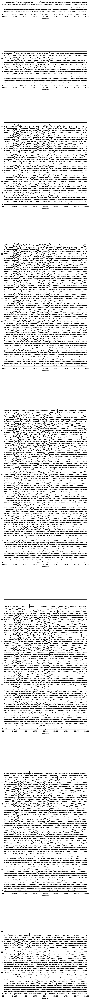

In [524]:
# plot time traces of all ROIs scaled by std
%matplotlib inline
cmap = plt.get_cmap('tab10')
cmaplist = [cmap(i) for i in range(cmap.N)]
xax = np.arange(0,np.shape(dat[0]['dFF'])[0]/500, 1/500)

# pos = np.arange(len(pos))
pos = np.argsort(stds)
yp = np.zeros(8)
ysize = np.zeros(16, dtype=np.int32)
for n in range(len(stds)):
    if not np.any(man_take_out_after_sort==n):
        planes = np.where([x != (0,0) for x in dat[pos[n]]['context_coord']['shapes']])[0]
        ysize[planes] += 1
f, a = plt.subplots(8,1, figsize=(10,120), gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': ysize[:8],
                       'wspace': 0.4,
                       'hspace': 0.4})
for n in range(len(stds)):
    if not np.any(man_take_out_after_sort==n):
        planes = np.where([x != (0,0) for x in dat[pos[n]]['context_coord']['shapes']])[0]
        for p in planes:
            if p<8:

                # a[p].plot(xax,dat[pos[n]]['dFF']*12 + yp[p], c=col, linewidth=1)
                a[p].plot(xax,dffs[pos[n]]/20 + yp[p], c='k')
                yp[p] += 1

                a[p].set_xlim((14, 16))
                a[p].set_xlabel('time (s)')
                # a.get_yaxis().set_visible(False)
                # a[p].xaxis.label.set_size(30)
                # a[p].tick_params(axis='x', labelsize=30)
                a[p].margins(x=0, y=0)
                    # a.set(frame_on=False)
image_format = 'png' # e.g .png, .svg, etc.
# image_name = r'H:\traces.png'

# f.savefig(image_name, format=image_format, bbox_inches='tight', dpi=600)
# f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\fig3\traces.svg', format="svg")

In [38]:
%matplotlib inline
# sel_cells = [[2, 3], [11,13,16,21],[8,33,35,39,50,3,10,29,55,56],[0,2,4,20,21,25,28,30,31],[123,128,130,114,110,32,18,12],
# [116,115,80,79,75,60,59,3,7,8],[127,128,117,95,67,68,40,22,23,24,0],[5,6,10,11,15,20,21,30,31,67,66]]
sel_cells = [[2, 3], [11,13,16],[3,8,10,33,39],[0,20,25,28,30,31],[8, 15, 27, 45, 46, 53],
[115,80,75,60,59],[67,68,40,23,24],[1, 22, 26, 28]]
sel_real = [ [] for _ in range(8) ]
cm = plt.get_cmap('tab10', 10)
#8: 1, 18, 22, 26, 28, 59
# plot time traces of all ROIs scaled by std
%matplotlib inline
cmap = plt.get_cmap('hsv', 25)
# cmaplist = [cmap(i) for i in range(cmap.N)]
# random.shuffle(cmaplist)
# cmaplist.pop(7)
xax = np.arange(0,np.shape(dat[0]['dFF'])[0]/500, 1/500)
dffs = []
colid = 0
for n, d in enumerate(dat):
    # col = cmaplist[np.mod(n, len(cmaplist))][0:3]
    if d:
        col = 'k'
        dff = d['dFF'] #- signal.medfilt(d['dFF'], 91)
        dff -= np.min(dff[14*500:16*500])
        dff /= np.max(dff[14*500:16*500])
        dffs.append(dff)
        
pos = np.arange(len(pos))
yp = np.zeros(8)
ycount = np.zeros(8)
ysize = np.zeros(16, dtype=np.int32)
orig_cell_id = []
orig_plane_id = []
cols = []
for n in range(len(stds)):
    planes = np.where([x != (0,0) for x in dat[n]['context_coord']['shapes']])[0]
    ysize[planes] += 1
f, a = plt.subplots(8,1, figsize=(10,20), gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': [len(k) for k in sel_cells],
                       'wspace': 0.0,
                       'hspace': 0.0})
for n in range(len(stds)):
    planes = np.where([x != (0,0) for x in dat[n]['context_coord']['shapes']])[0]
    for p in planes:
        if p<8:
            if np.any(sel_cells[p]==ycount[p]):
                # a[p].plot(xax,dat[pos[n]]['dFF']*12 + yp[p], c=col, linewidth=1)
                if np.any(orig_cell_id == pos[n]):
                    col = cols[np.where(orig_cell_id==pos[n])[0][0]]
                else:
                    col = cmaplist[colid]
                    colid += 1
                l = a[p].plot(xax,dffs[pos[n]] + yp[p], linewidth=1, c=col)
                c = to_rgba(l[0].get_color())
                a[p].text(x=14,y=yp[p],s=str(pos[n]),c='k')
                orig_cell_id.append(pos[n])
                orig_plane_id.append(p)
                cols.append(c)
                # tmp_list.append((ycount[p], pos[n]))
                yp[p] += 1
                sel_real[p].append((int(ycount[p]), pos[n]))
                a[p].set_xlim((13, 16))
                a[p].set_xlabel('time (s)')
                # a.get_yaxis().set_visible(False)
                # a[p].xaxis.label.set_size(30)
                # a[p].tick_params(axis='x', labelsize=30)
                a[p].margins(x=0, y=0)
            ycount[p] += 1
image_format = 'png' # e.g .png, .svg, etc.
# image_name = r'H:\traces.png'

# f.savefig(image_name, format=image_format, bbox_inches='tight', dpi=600)
# f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\fig3\traces_for_weights_only.svg', format="svg")

TypeError: 'bool' object is not subscriptable

In [13]:
image_files = glob(r'C:\Users\Urs\Documents\remote_focusing_manuscript\20230425\rec03\rec03_plane_*_expcorr_motion_corrected_meanFrame.tif')
mean_frames = [io.imread(file) for file in image_files]
# print(image_files)

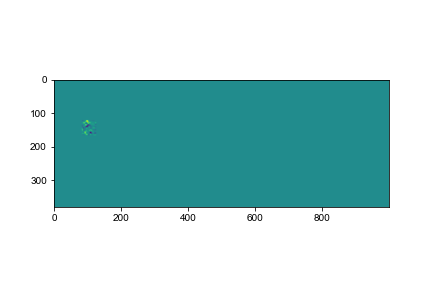

In [49]:
%matplotlib widget
plt.imshow(dat[pos[0]]['weights'][plane,:,:].T)

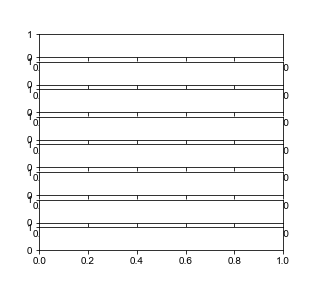

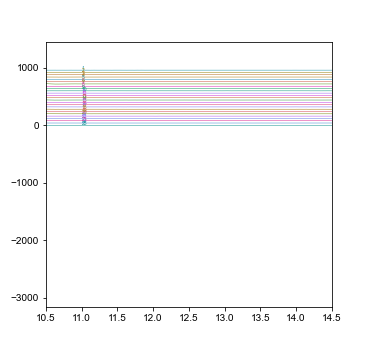

In [43]:
# plot selection with random colors
plt.close('all')
%matplotlib widget
centi=1/2.54
plt.rcParams["font.family"] = "Arial"
f, a = plt.subplots(8,1, figsize=(11.1*centi,10.1*centi))
f2,a2 = plt.subplots(figsize=(13.0*centi,12.4*centi))
for n in range(8):
    if n > 7:
        a[n-8].imshow(mean_frames[n], cmap='gray')
counter = 0
inc = 0
stds = [np.max(d[500:]) for d in dffs]
pos = np.argsort(stds)


cmap = plt.get_cmap('cmo.phase', 25)
cmaplist = [cmap(i) for i in range(cmap.N)]
random.shuffle(cmaplist)
# for k in range(len(orig_cell_id)):
for k in range(len(stds)-1, -1, -1):
    if not np.any(man_take_out_after_sort==k) and (counter < 25) and not np.any(np.array([262,240,211,256,214,229,248,255,257,269,263,258,200,230,273,264,219,271,
                               275,250,261,204,210,261,196,198, 209, 254])==k):
        
        a2.plot(xax,dffs[pos[k]] + 24*40 - inc*40, c=cmaplist[counter], linewidth=.5)
        a2.text(11, 24*40 - inc*40, counter+1, c=cmaplist[counter], size=5)
        inc +=1
        for plane in range(8):
            if plane > 7:
                xy = dat[pos[k]]['context_coord']['corner'][plane]
                w = dat[pos[k]]['context_coord']['shapes'][plane][0]
                h = dat[pos[k]]['context_coord']['shapes'][plane][1]
                wim = np.zeros((mean_frames[0].shape[0], mean_frames[0].shape[1],4))
                alph = np.copy(dat[pos[k]]['weights'][plane,:,:].T)
                # alph -=np.min(alph)
                alph /=np.max(dat[pos[k]]['weights'])
                # alph *= 1600
                alph[alph<0.0]=0
                # alph = 1-alph
                # col = cm(np.mod(k,10)/10)
                wim[:,:,0] = cmaplist[counter][0]
                wim[:,:,1] = cmaplist[counter][1]
                wim[:,:,2] = cmaplist[counter][2]
                wim[:,:,3] = alph
                wim = np.where(wim>1, 1, wim)
                a[plane-8].imshow(wim)
                a[plane-8].axis('off')
                # a[orig_plane_id[k]].add_patch(Rectangle(xy,w,h,
                #                                        edgecolor=col,
                #                                         facecolor='none',))
                if not np.all(np.asarray(xy)==0):
                    # a[plane-8].text(xy[0], xy[1], k, c=cmaplist[counter], fontsize=6)
                    a[plane-8].text(xy[0], xy[1], counter+1, c=cmaplist[counter], fontsize=6)
        counter += 1
a2.set_xlim([10.5,14.5]);

# f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\fig3\weights.svg', format="svg")
# f2.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\fig3\traces.svg', format="svg")

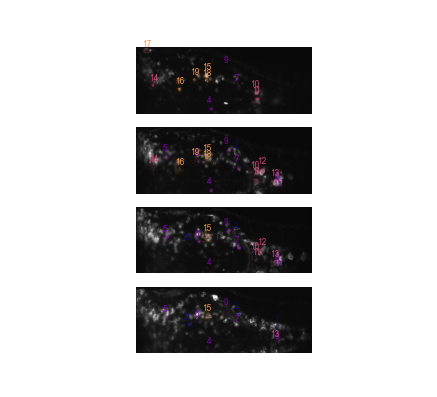

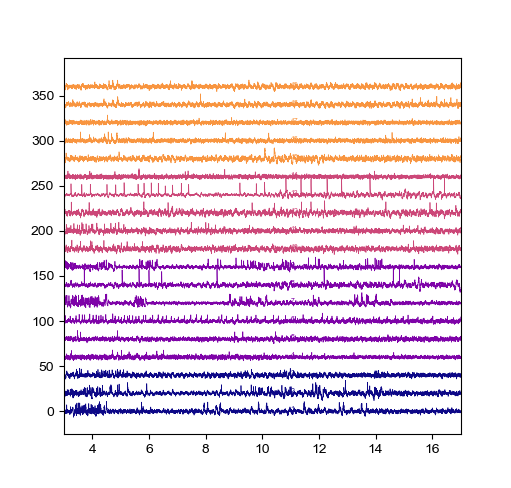

In [32]:
#plot selection based on position
plt.close('all')
%matplotlib widget
centi=1/2.54
plt.rcParams["font.family"] = "Arial"
f, a = plt.subplots(4,1, figsize=(11.1*centi,10.1*centi))
f2,a2 = plt.subplots(figsize=(13.0*centi,12.4*centi))
for n in range(8):
    if n > 3:
        a[n-8].imshow(mean_frames[n], cmap='gray')
counter = 0
inc = 0
stds = [np.max(d[500:]) for d in dffs]
pos = np.argsort(stds)
cmap = plt.get_cmap('plasma', 5)
cmaplist = [cmap(i) for i in range(cmap.N)]

z_pos = [np.unravel_index(np.argmax(d['weights'][:,:,:]),d['weights'].shape)[0] for d in dat]
z_pos = [(a-7)*-1 if a>3 else a for a in z_pos]
tmpdf = []
tmp_z_pos = []
dat_ind = []
for k in range(len(stds)-1, -1, -1):
    # if not np.any(man_take_out_after_sort==k) and (counter < 25) and not np.any(np.array([262,240,211,256,214,229,248,255,257,269,263,258,200,230,273,264,219,271,
    #                            275,250,261,204,210,261,196,198, 209, 254])==k):
    if not np.any(man_take_out_after_sort==k) and (counter < 25) and not np.any(np.array([999])==k):
        tmpdf.append(dffs[pos[k]])
        tmp_z_pos.append(z_pos[pos[k]])
        dat_ind.append(pos[k])
        counter += 1
arg_z_pos = np.argsort(tmp_z_pos)
counter = 0 
for k in range(len(dat_ind)):
    # lat_pos = np.unravel_index(np.argmax(dat[pos[k]]['weights'][8:,:,:]),dat[pos[k]]['weights'].shape)[0]
    col = cmaplist[tmp_z_pos[arg_z_pos[k]]]
    a2.plot(xax,dffs[dat_ind[arg_z_pos[k]]] + k*20, c=col, linewidth=.5)
    a2.text(11, k*20, k+1, c=col, size=5)
    inc +=1
    for plane in range(8):
        if plane > 3:
            xy = dat[dat_ind[arg_z_pos[k]]]['context_coord']['corner'][plane]
            w = dat[dat_ind[arg_z_pos[k]]]['context_coord']['shapes'][plane][0]
            h = dat[dat_ind[arg_z_pos[k]]]['context_coord']['shapes'][plane][1]
            wim = np.zeros((mean_frames[0].shape[0], mean_frames[0].shape[1],4))
            alph = np.copy(dat[dat_ind[arg_z_pos[k]]]['weights'][plane,:,:].T)
            # alph -=np.min(alph)
            alph /=np.max(dat[dat_ind[arg_z_pos[k]]]['weights'])
            # alph *= 1600
            alph[alph<0.0]=0
            # alph = 1-alph
            # col = cm(np.mod(k,10)/10)
            wim[:,:,0] = col[0]
            wim[:,:,1] = col[1]
            wim[:,:,2] = col[2]
            wim[:,:,3] = alph
            wim = np.where(wim>1, 1, wim)
            a[plane-4].imshow(wim)
            a[plane-4].axis('off')
            # a[orig_plane_id[k]].add_patch(Rectangle(xy,w,h,
            #                                        edgecolor=col,
            #                                         facecolor='none',))
            if not np.all(np.asarray(xy)==0):
                # a[plane-8].text(xy[0], xy[1], k, c=cmaplist[counter], fontsize=6)
                a[plane-4].text(xy[0], xy[1], k+1, c=col, fontsize=6)
    counter += 1
# a2.plot([11.64, 11.64], [0, k*40], c='k', linewidth=0.5)
a2.set_xlim([3,17]);
f.savefig(r'C:\Users\Urs\Documents/remote_focusing_manuscript\hb_weights.svg', format="svg", dpi=300)
f2.savefig(r'C:\Users\Urs\Documents/remote_focusing_manuscript\hb_traces.svg', format="svg", dpi=300)

In [23]:
 cmaplist

[(0.050383, 0.029803, 0.527975, 1.0),
 (0.494877, 0.01199, 0.657865, 1.0),
 (0.798216, 0.280197, 0.469538, 1.0),
 (0.973416, 0.585761, 0.25154, 1.0),
 (0.940015, 0.975158, 0.131326, 1.0)]

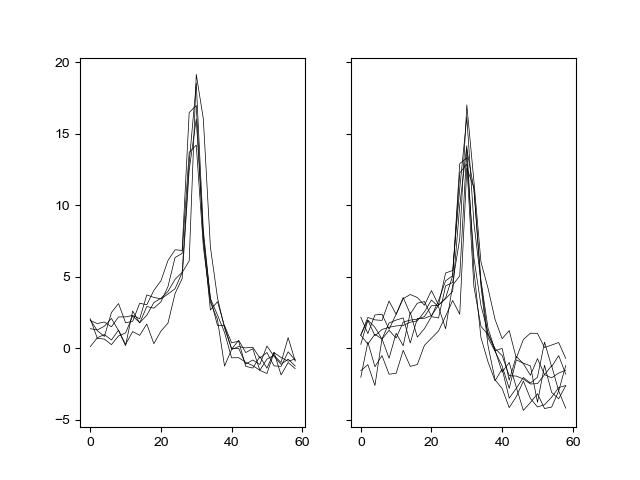

In [129]:
f,a = plt.subplots(1,2, sharex=True, sharey=True)
# a.plot(xax[xax<2.5],dffs[dat_ind[arg_z_pos[5]]][xax<2.5], c='k', linewidth=.5)
# a.plot(xax[xax>17.5]-17.5,dffs[dat_ind[arg_z_pos[5]]][xax>17.5], c='r', linewidth=.5)
y = dffs[dat_ind[arg_z_pos[5]]]
pks = signal.find_peaks(y, height=10)
# a.plot(xax, dffs[dat_ind[arg_z_pos[5]]])
# a.scatter(xax[pks[0]],y[pks[0]],c='r')
for p in pks[0]:
    if xax[p]<2.5:
        a[0].plot(xax[:30]*1000, y[p-15:p+15], c='k', linewidth=.5)
    if xax[p]>18.5:
        a[1].plot(xax[:30]*1000, y[p-15:p+15], c='k', linewidth=.5)
f.savefig(r'C:\Users\Urs\Documents/remote_focusing_manuscript\spikes_example.svg', format="svg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

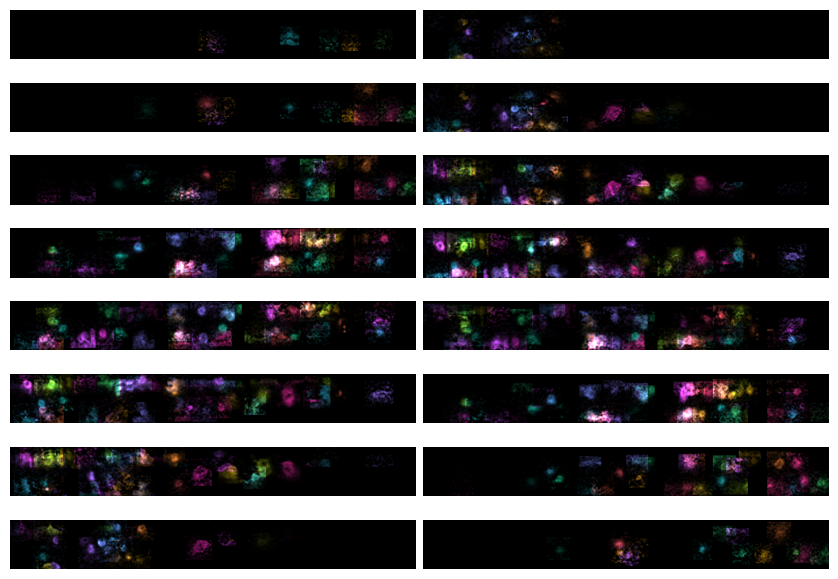

In [672]:
%matplotlib inline
f, a = plt.subplots(8,2, figsize=(21*centi,14.8*centi), gridspec_kw={
                           'width_ratios': [1,1],
                           'height_ratios': [1,1,1,1,1,1,1,1],
                           'wspace': 0,
                           'hspace': 0}, layout="constrained")
# for n in range(8):
#     # a[n].imshow(mean_frames[n], cmap='gray')
cmap = plt.get_cmap('cmo.phase', np.shape(dffsort)[0])
cmaplist = [cmap(i) for i in range(cmap.N)]
random.shuffle(cmaplist)
inc = 0
composite = np.zeros((16,mean_frames[0].shape[0], mean_frames[0].shape[1],3))
for k in range(len(pos)):
    if not np.any(man_take_out_after_sort==k):
    # if k==175:
        
        rand = np.random.rand()
        for plane in range(16):
            xy = dat[pos[k]]['context_coord']['corner'][plane]
            w = dat[pos[k]]['context_coord']['shapes'][plane][0]
            h = dat[pos[k]]['context_coord']['shapes'][plane][1]
            # wim = np.zeros((mean_frames[0].shape[0], mean_frames[0].shape[1],4))
            alph = np.copy(dat[pos[k]]['weights'][plane,:,:].T)
            # alph -=np.min(alph)
            alph /=np.max(dat[pos[k]]['weights'])
            # alph *= 800
            alph[alph<0.0]=0
            alph[alph>1]=1
            # alph = 1-alph
            # col = cm(np.mod(k,10)/10)
#             wim[:,:,0] = cmaplist[k][0]
#             wim[:,:,1] = cmaplist[k][1]
#             wim[:,:,2] = cmaplist[k][2]
            # if (iter%2)==0:
            #     wim[:,:,0] = 1
            #     wim[:,:,1] = 0
            #     wim[:,:,2] = 0
            #     col = 'r'
            # else:
            #     wim[:,:,0] = 0
            #     wim[:,:,1] = 1
            #     wim[:,:,2] = 0
            #     col = 'g'
            
            # wim[:,:,3] = alph
            
            composite[plane,:,:,0] += cmaplist[inc][0]*alph 
            composite[plane,:,:,1] += cmaplist[inc][1]*alph 
            composite[plane,:,:,2] += cmaplist[inc][2]*alph
            
            # if rand>0.5:
            #     composite[plane,:,:,0] += 1*alph  
            #     composite[plane,:,:,2] += 1*alph
            #     col = 'm'
            # else:
            #     composite[plane,:,:,1] += 1*alph  
            #     col = 'g'
            # a[plane].imshow(wim)
            # a[orig_plane_id[k]].add_patch(Rectangle(xy,w,h,
            #                                        edgecolor=col,
            #                                         facecolor='none',))
            # if not np.all(np.asarray(xy)==0):
            #     a[plane].text(xy[0], xy[1], k, c=col, fontsize=6)
        inc +=1
for plane,ax in enumerate(a.flatten(order='F')):
    
    ax.imshow(composite[plane,:,:,:])
    ax.axis('off')
f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\figS3_all_traces\all_spaces.svg', format="svg")

In [669]:
a.flatten(order='F')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

In [512]:
# plot spatial footprints
%matplotlib inline
ims = [d['weights'] if d else np.zeros((16,1000,122)) for d in dat]

sz = []
tmp2 = np.array([])
imtmp2 = np.array([])

for im in ims:
    ix = np.any(im>0, axis=(0,2))
    sz.append(np.sum(ix))
for n in range(len(ims)):
    if not np.any(man_take_out_after_sort==n):
# for im in ims:
        ix = np.any(ims[pos[n]]>0, axis=(0,2))
        tmp = np.array([])
        imtmp = np.array([])
        for k in range(16):
            # tmp = np.hstack((tmp,im[k,:,:], np.ones((np.shape(tmp)[0],5))*-1))
            # tmp = np.hstack((tmp,im[k,ix,:])) if n>0 else im[k,ix,:]
            tmp = np.hstack((tmp,ims[pos[n]][k,ix,:])) if k>0 else ims[pos[n]][k,ix,:]
            imtmp = np.hstack((imtmp,mean_frames[k][:,ix].T)) if k>0 else mean_frames[k][:,ix].T
        # tmp /= np.max(tmp)
        if tmp2.size:
            tmp2 = np.vstack((tmp2,tmp, np.zeros((np.max(sz) - tmp.shape[0],tmp.shape[1]))))
            imtmp2 = np.vstack((imtmp2,imtmp, np.zeros((np.max(sz) - tmp.shape[0],tmp.shape[1]))))
        else:
            tmp2 = np.vstack((tmp,np.zeros((np.max(sz) - tmp.shape[0],tmp.shape[1]))))
            imtmp2 = np.vstack((imtmp,np.zeros((np.max(sz) - tmp.shape[0],tmp.shape[1]))))
   

In [513]:
plt.close('all')

gc.collect()

10332

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


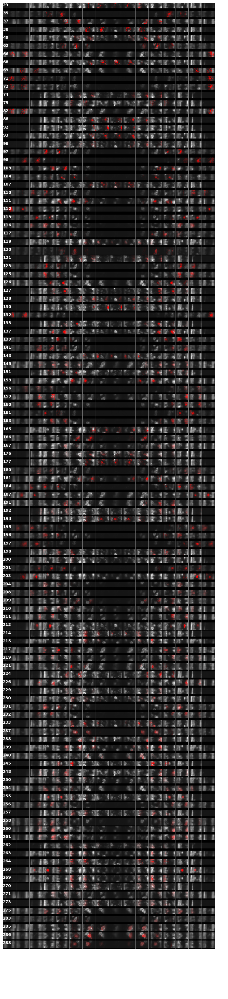

In [514]:
f,a = plt.subplots(figsize=(10,80))    
    # ax.imshow(im, vmin=np.min(dat[0]['weights']), vmax=np.max(dat[0]['weights']))
# a.imshow(tmp2, vmax=.001, vmin=-.001, cmap='seismic')
a.imshow(imtmp2, cmap='gray')
overlay = np.zeros((tmp2.shape[0], tmp2.shape[1], 4))
overlay[:,:,3] = tmp2*1000
overlay = np.where(overlay>1, 1, overlay)
overlay[:,:,0] = 1
a.imshow(overlay)
inc = 30
for n in range(len(ims)):
    if not np.any(man_take_out_after_sort==n):
        a.text(0, inc, str(n), c='w')
        inc += 75
a.axis('off')
# for n in range(len(sz)):
    # a.plot([0, 122*16], [np.max(sz)*n, np.max(sz)*n], c='w', linewidth=.7)
for s in range(16):
    a.plot([(s+1)*122, (s+1)*122],[0,tmp2.shape[0]], c='gray', linewidth=.7)

In [7]:
def get_index():
    r = 0
    planes = np.roll(np.arange(0,16),r)
    up = planes[0:8]
    down = planes[-1:-9:-1]

    idx1 = np.zeros(16, dtype='int')

    for n in range(8):
        idx1[n*2] = up[n]
        idx1[2*n+1] = down[n]

    planes = np.roll(np.arange(0,16),r-1)
    up = planes[0:8]
    down = planes[-1:-9:-1]    
    idx2 = np.zeros(16, dtype='int')
    for n in range(8):
        idx2[n*2] = down[n]
        idx2[2*n+1] = up[n]
    return idx1, idx2

imfiles = sorted(glob(r'Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\rec01_plane_[0-9][0-9]_expcorr_motion_corrected_meanFrame.tif'))
print(imfiles)
ims = []
for f in imfiles:
    ims.append(io.imread(f))
    # print('loading image: ' + str(f))

masks_3d = np.load(r'Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\y_shift_stack_seg.npy', allow_pickle=True)
mask = masks_3d[()]['masks']

idx1, idx2 = get_index()

shifts = []
# n = [k for k in range(16)]
n = idx1
# n.append(0)
for i in range(15):
    shift, error, diffphase = phase_cross_correlation(ims[n[i]][:62,:], ims[n[i+1]][:62,:], upsample_factor=20, normalization=None)
    shifts.append(shift)
shifts = [[n[0], 0.] for n in shifts]
shifts = np.asarray(shifts)
# print(shifts)

['Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_00_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_01_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_02_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_03_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_04_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_05_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_06_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_07_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fish_PTZ\\rec01\\rec01_plane_08_expcorr_motion_corrected_meanFrame.tif', 'Y:\\hpc\\rw\\user\\urs\\20230425_fi

In [8]:
# register all planes to each other
# find min and max shift and pad input images
miny = np.floor(np.min(np.cumsum(shifts[:,0]))).astype('int')
maxy = np.ceil(np.max(np.cumsum(shifts[:,0]))).astype('int')
minx = np.floor(np.min(np.cumsum(shifts[:,1]))).astype('int')
maxx = np.ceil(np.max(np.cumsum(shifts[:,1]))).astype('int')
# print(str(minx) + ', ' + str(maxx))

#pad images
bigy = np.shape(ims[0])[0] + np.abs(miny) + np.abs(maxy)
bigx = np.shape(ims[0])[1] + np.abs(minx) + np.abs(maxx)
# print(str(bigy) + ', ' + str(bigx))
starty = np.abs(miny)
endy = np.shape(ims[0])[0] + np.abs(miny)
startx = np.abs(minx)
endx = np.shape(ims[0])[1] + np.abs(minx)


In [8]:
shiftstack = io.imread(r"Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\y_shift_stack.tif")

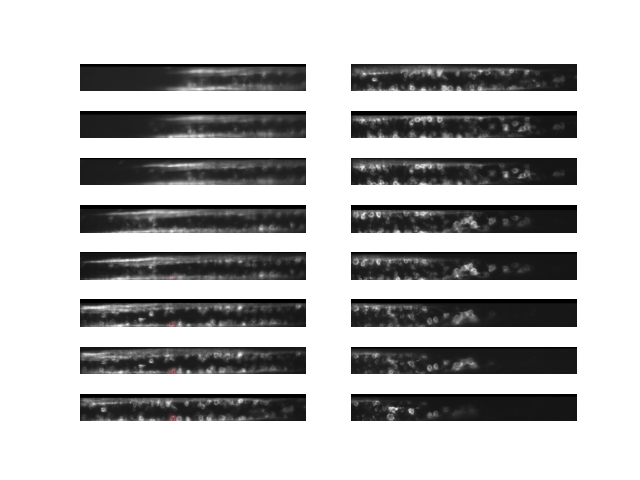

In [108]:
%matplotlib widget
cn = 81
ws = dat[cn]['weights']
imsPad = []
for im in ws:
    im = im.T
    bigim = np.zeros((bigy, bigx))
    bigim[starty:endy, startx:endx] = im
    imsPad.append(bigim)

imsTrans = [imsPad[idx1[0]]]
for n in range(15):
    s = (np.sum(shifts[0:n+1,1], axis=0), np.sum(shifts[0:n+1,0], axis=0))
    tf = AffineTransform(translation=s)
    imWarp = warp(imsPad[idx1[n+1]], tf.inverse)
    imsTrans.append(imWarp)
imsTrans = [imsTrans[i] for i in np.argsort(idx1)]
c2 = np.ceil(imsTrans[0].shape[0]/2).astype('int')

imsFinal = []
for n in range(16):
    # tmpIm = imsTrans[idx2[n]][:,:]
    tmpIm = np.vstack((imsTrans[idx2[n]][:c2,:], imsTrans[idx1[n]][c2:,:]))
    imsFinal.append(tmpIm)
id=0
f, a = plt.subplots(8,2)
for n in range(2):
    for k in range(8):
        a[k,n].imshow(shiftstack[id], cmap='gray')
        # a[k,n].imshow(imsFinal[id], cmap='Reds', alpha=0.5, vmin=0, vmax=np.max(imsFinal))
        achannel = imsFinal[id]/np.max(imsFinal)
        achannel[achannel<0] = 0
        a[k,n].imshow(np.ones((122,1000)), cmap='Reds', alpha=achannel, vmin=0, vmax=1)
        a[k,n].axis('off')
        id += 1

In [57]:
weightStack = np.zeros(shiftstack.shape)
indWeights = []
# dFFs = np.asarray([d['dFF'][int(14.2*500):int(15.2*500)] for d in dat])
dFFs = np.asarray([d[int(14.2*500):int(15.2*500)] for d in dffs])

In [9]:
for cn in range(len(dat)):
    # cn = 81
    ws = dat[cn]['weights']
    imsPad = []
    for im in ws:
        im = im.T
        bigim = np.zeros((bigy, bigx))
        bigim[starty:endy, startx:endx] = im
        imsPad.append(bigim)

    imsTrans = [imsPad[idx1[0]]]
    for n in range(15):
        s = (np.sum(shifts[0:n+1,1], axis=0), np.sum(shifts[0:n+1,0], axis=0))
        tf = AffineTransform(translation=s)
        imWarp = warp(imsPad[idx1[n+1]], tf.inverse)
        imsTrans.append(imWarp)
    imsTrans = [imsTrans[i] for i in np.argsort(idx1)]
    c2 = np.ceil(imsTrans[0].shape[0]/2).astype('int')

    imsFinal = []
    for n in range(16):
        # tmpIm = imsTrans[idx2[n]][:,:]
        tmpIm = np.vstack((imsTrans[idx2[n]][:c2,:], imsTrans[idx1[n]][c2:,:]))
        imsFinal.append(tmpIm)
    indWeights.append(np.asarray(imsFinal))

In [42]:
weightMov = np.zeros((500, shiftstack.shape[0], shiftstack.shape[1], shiftstack.shape[2]), dtype=np.uint8)
tmpMov = np.zeros((500, shiftstack.shape[0], shiftstack.shape[1], shiftstack.shape[2]), dtype=np.uint8)
maxdf = np.max(dFFs)

In [18]:
dFFs.shape

(289, 500)

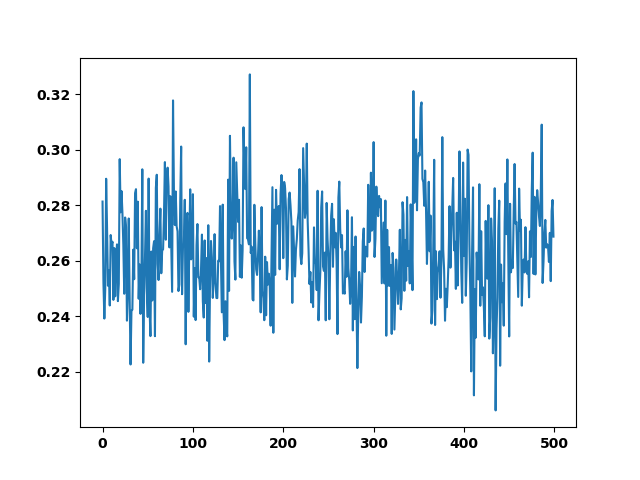

In [49]:
f, a = plt.subplots()
# a.plot((dFFs.T+ 10)*255/40);
a.plot(tmpdFF)

In [50]:
t1 = time.time()
for c in range(dFFs.shape[0]):
    if not np.any(man_take_out_after_sort==c):
        t2 = time.time()
        tmpW = indWeights[c]/np.max(indWeights[c])
        tmpW[tmpW<0] = 0
        # tmpW = np.uint16(tmpW*(2**16-1))
        tmpdFF = np.copy(dFFs[c,:])
        tmpdFF -= np.min(dFFs)
        tmpdFF /= np.max(dFFs)-np.min(dFFs)
        # tmpdFF = (tmpdFF + 10)*255/40
        # tmpdFF[tmpdFF>255] = 255
        # tmpdFF[tmpdFF<0] = 0
        # mindf = np.min(tmpdFF)
        # tmpdFF -= mindf
        # tmpdFF /=(maxdf-mindf)
        # tmpWMov = np.broadcast_to(tmpW, tmpMov.shape)
        # tmpMov = np.uint8((2**8-1)*tmpWMov*tmpdFF[:,np.newaxis, np.newaxis, np.newaxis])
        for t in range(500):
            tmpMov[t,:,:,:] = np.uint8((2**8-1)*tmpW*tmpdFF[t])
            # tmpMov[t,:,:,:] = np.uint8(tmpW*tmpdFF[t])
        print('loop was: ' + str(time.time() - t2))
        t3 = time.time()
        weightMov = np.maximum(tmpMov, weightMov)
        print('comparison was: ' + str(time.time() - t3))
print('total time was ' + str(time.time() - t1))

loop was: 7.433724641799927
comparison was: 0.400754451751709
loop was: 6.712235689163208
comparison was: 0.4218258857727051
loop was: 6.947899580001831
comparison was: 0.39290761947631836
loop was: 8.218424797058105
comparison was: 0.4308280944824219
loop was: 7.9081268310546875
comparison was: 0.4532933235168457
loop was: 8.788174152374268
comparison was: 0.43655967712402344
loop was: 7.717760324478149
comparison was: 0.43683838844299316
loop was: 8.537485361099243
comparison was: 0.43459558486938477
loop was: 7.714862585067749
comparison was: 0.44557762145996094
loop was: 7.941320180892944
comparison was: 0.44890856742858887
loop was: 7.558239221572876
comparison was: 0.4345228672027588
loop was: 7.822358131408691
comparison was: 0.4266667366027832
loop was: 7.56295108795166
comparison was: 0.43630194664001465
loop was: 7.676647663116455
comparison was: 0.4364967346191406
loop was: 7.9323811531066895
comparison was: 0.4363117218017578
loop was: 7.17833399772644
comparison was: 0.436

In [ ]:
np.save(r'Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\weightMov_14200-15200_ms_zscore_subset.npy', weightMov)

In [10]:
weightMov = np.load(r'Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\weightMov_14200-15200_ms_zscore_subset.npy')

In [51]:
tt = weightMov[:,10]

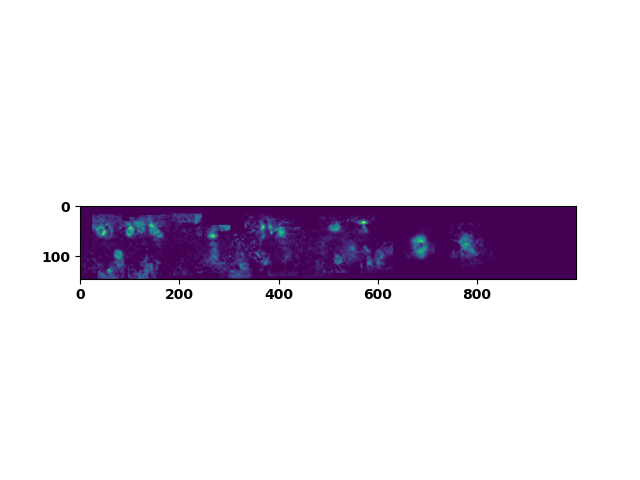

In [52]:
f, a = plt.subplots()
a.imshow(tt[100,:,:])

In [18]:
# f, a = plt.subplots()
cmapi = plt.get_cmap('inferno')
cmapg = plt.get_cmap('gray')
colMov = np.zeros((weightMov.shape[0], weightMov.shape[1], weightMov.shape[2], weightMov.shape[3], 3), dtype=np.uint8)
for p in range(weightMov.shape[1]): # weightMov.shape[1]
    print(p)
    rgb1 = cmapg((shiftstack[p,:,:]-20)/(np.max(shiftstack)-20))
    for t in range(weightMov.shape[0]):
            rgb2 = cmapi((weightMov[t,p,:,:]/np.max(weightMov))*3)
            colIm = (.5*rgb1 + .5*rgb2)[:,:,0:3]
            colIm = np.uint8((2**8-1) * colIm)
            colMov[t,p,:,:,:] = colIm
# a.imshow(colIm)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


In [69]:
np.max(dFFs)/3

14.42204274031734

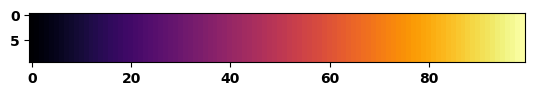

In [30]:
cmapi = plt.get_cmap('inferno')
cmapg = plt.get_cmap('gray')
# rgb1 = cmapg((shiftstack[3,:,:]-20)/(np.max(shiftstack)-20))
rgb1 = cmapg(np.zeros((10,100)))
# rgb2 = cmapi((weightMov[100,3,:,:]/255)*3)
rgb2 = cmapi(np.tile(np.linspace(0,1,100), (10,1)))
colIm = (.5*rgb1 + .5*rgb2)[:,:,0:3]
colIm = np.uint8((2**8-1) * colIm)
f,a = plt.subplots()
a.imshow(rgb2)
io.imsave(r'H:\montageMov2_inferno_zscore_subset2_colorbar.tif', rgb2)

In [ ]:
np.save(r'Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\colMov_14200-15200_ms_zscore_subset.npy', colMov)

In [3]:
colMov = np.load(r'Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\colMov_14200-15200_ms_zscore_subset.npy')

In [61]:
montageMov = np.reshape(colMov[:,0::2,:,:,:], (colMov.shape[0], -1, colMov.shape[3], colMov.shape[4]))
montageMov[:,40:55,40:190,:] = 255*cmapi(np.tile(np.linspace(0,1,150), (15,1)))[:,:,:3]
montageMov[:,100:115,40:93,:] = 255

In [63]:
io.imsave(r'H:\montageMov2_inferno_zscore_subset2.tif', montageMov)

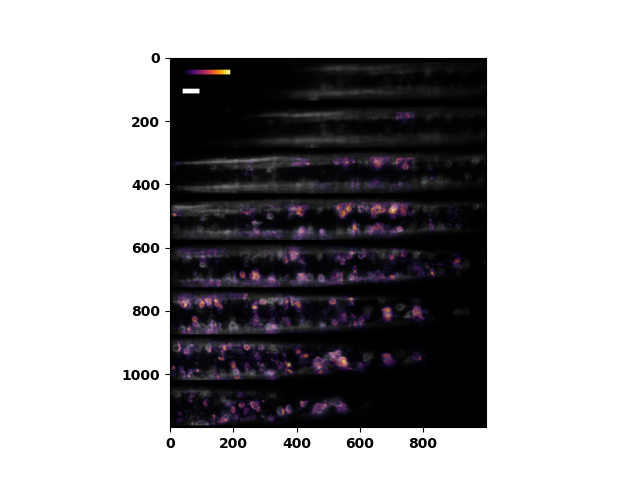

In [62]:
# for n in range(146,1168,146):
#     montageMov[:,n,:,:] = 255
%matplotlib widget
f, a = plt.subplots()
# a.imshow((cmapi(np.tile(np.linspace(0,255,200), (40,1)))[:,:,:3]))
a.imshow(montageMov[100,:,:,:])
# np.max(dFFs)

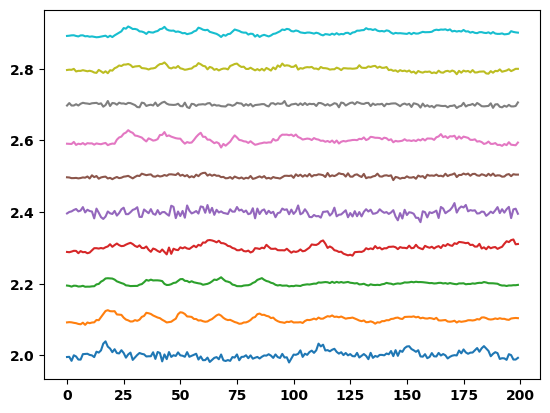

In [191]:
f, a = plt.subplots()
# a.imshow(((2**16-1)*tmpW*dFFs[0,0]/maxdf)[0,:,:])
# a.imshow(colIm)
# a.imshow(colMov[100,3,:,:,:])
for n in range(20,30):
    a.plot(dFFs[n,:] + n*0.1)
# # a.plot(tmpdFF)
# print(np.min(dFFs))

In [207]:
colMov.shape

(200, 16, 146, 1000, 3)

In [89]:
t1 = time.time()
weightMov = np.maximum(tmpMov,weightMov)
print(time.time() - t1)

0.922255277633667


In [85]:
weightMov.shape

()

In [6]:
v1 = napari.Viewer()

In [39]:
v1.add_image(colMov)

C:\Users\jlab\anaconda3_new_install\envs\data_analysis\lib\site-packages\vispy\gloo\texture.py:44: UserWarning: GPUs can't support dtypes bigger than 32-bit, but got 'float64'. Precision will be lost due to downcasting to 32-bit.
  warnings.warn(


<Image layer 'colMov [2]' at 0x2e620ca6130>

In [188]:
np.swapaxis(colMov, 1, 2).shape

AttributeError: module 'numpy' has no attribute 'swapaxis'

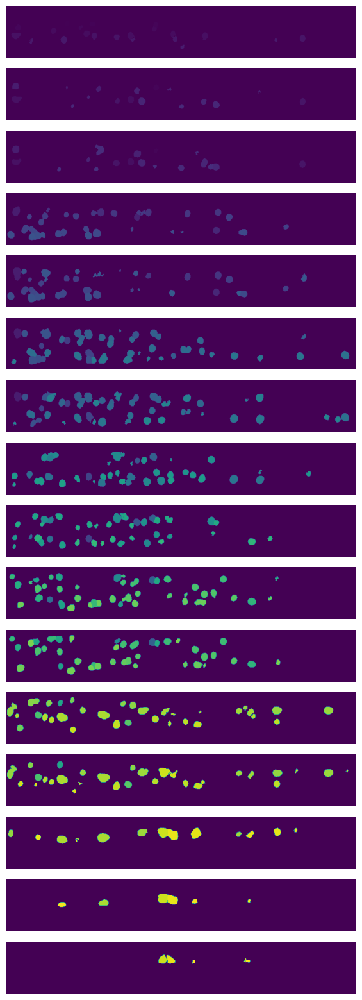

In [70]:
%matplotlib inline

# , figsize=(10,20)
f, a = plt.subplots(16, figsize=(10,20))
for n in range(16):
    # a[n].imshow(imsFinal[n], vmax=0.001, vmin=-0.001, cmap='seismic')
    # contours = measure.find_contours(mask[n,:,:]==cn+1)
    # for contour in contours:
    #     a[n].plot(contour[:, 1], contour[:, 0], c='k', linewidth=1)
    a[n].imshow(mask[n,:,:], vmin=0, vmax=np.max(mask))
    a[n].axis('off')

In [72]:
io.imsave(r'Y:\hpc\rw\user\urs\20230418_rec09\mask_stack.tif', np.asarray(mask.astype(np.float32)))

In [ ]:
dat = np.load(r"Y:\hpc\rw\user\urs\20230418_rec06\volpy_3D_simple_thresh_results.npy", allow_pickle=True)[()]

In [ ]:
f, a = plt.subplots(figsize=(8,20))
snr_idx = [d['snr'] for d in dat]
spike_idx = [np.mean(d['dFF'][d['spikes']])/np.std(d['dFF']) for d in dat]
spike_idx = np.argsort(spike_idx)
snr_idx = np.argsort(snr_idx)
# print(snr_idx)
for n, d in enumerate(dat):
    col = 'k' if d['locality'] else 'gray'
    # a.plot(d['dFF'] + d['cell_n']/10, c=col, linewidth=0.8)
    a.plot(d['dFF'] + spike_idx[n]/10, c=col, linewidth=0.8)
    a.eventplot(d['spikes'], lineoffset=spike_idx[n]/10, linelength=.01, linewidth=.8, colors='r') 
    a.set_xlim((50, 10050))

In [11]:
mov = io.imread(r"H:\Urs_data\20230418_fish_PTZ\rec06_plane_01.tif")

C:\Users\jlab\AppData\Local\Temp\ipykernel_11208\3635896801.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f,a = plt.subplots(2,1, figsize=(13,10))
MovieWriter imagemagick unavailable; using Pillow instead.


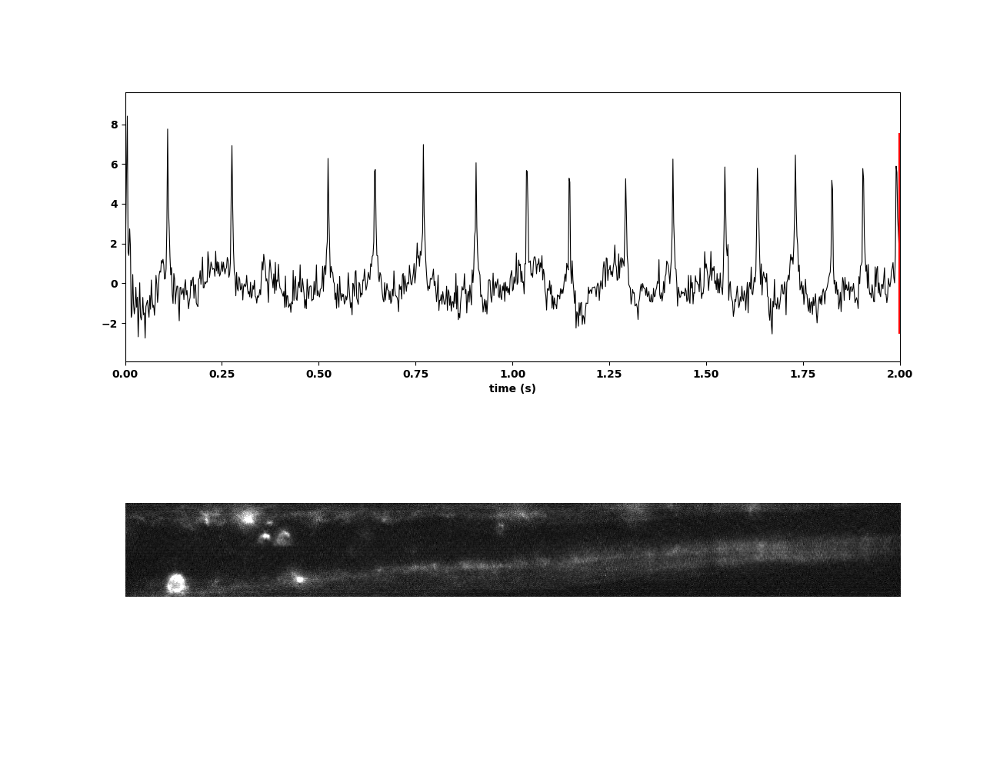

In [41]:
# animation of example cell and raw data
f,a = plt.subplots(2,1, figsize=(13,10))
a[0].plot(xax,dat[1]['dFF']/np.std(dat[1]['dFF']), c='k', linewidth=0.8)
line = a[0].plot([xax[0], xax[0]], [-2.5, 7.5], c='r')
a[0].set_xlim((0,2))
a[0].set_xlabel('time (s)')
im = a[1].imshow(mov[1000,:,:], cmap='gray', vmin=15, vmax=80)
a[1].axis('off')

def init():
    line[0].set_data([], [])
    im.set_data(mov[0,:,:])
    return line, im
def animate(i):
    line[0].set_data([xax[i], xax[i]], [-2.5, 7.5])
    im.set_data(mov[i,:,:])
    return im, line
            
anim = FuncAnimation(f, animate, init_func=init,
                               frames=1000, interval=20, blit=True, repeat = False)
anim.save(r'H:\Urs_data\20230418_fish_PTZ\example_recording_rec06_plane00_20230418.gif', writer='imagemagick')

In [14]:
corr_mov = io.imread(r"Y:\hpc\rw\user\urs\20230418_rec06\rec06_plane_00_expcorr_motion_corrected.tif")

In [15]:
corr_mov = np.reshape(corr_mov, (corr_mov.shape[0],-1))

In [16]:
meanImage = np.mean(corr_mov,0)

In [17]:
mov = np.reshape(mov, (mov.shape[0], -1))

Text(0.5, 0, 'frequency (Hz)')

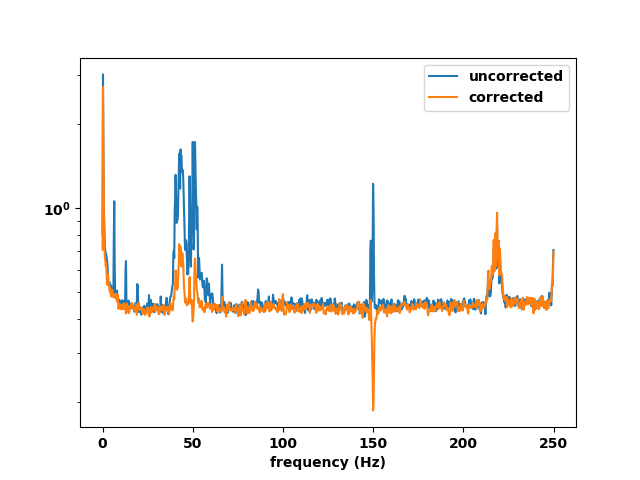

In [264]:
noise = np.random.poisson(lam=(meanImage[meanImage>80]-20)*(200/256), size=(corr_mov.shape[0], np.shape(meanImage[meanImage>80])[0]))
f,a = plt.subplots()
# p,f = a.psd(corr_mov[:,np.argmax(meanImage)], Fs=500);
# a.hist(meanImage.flatten())
# a.plot(corr_mov[:,meanImage>50]);
# np.sum(meanImage>50)
f, Pxx = signal.welch((mov[:,meanImage>80])*(200/256), fs=500, axis=0, scaling='density', nperseg=2001)
a.semilogy(f, np.sqrt(np.mean(Pxx,axis=1)), label='uncorrected')
f, Pxx = signal.welch((corr_mov[:,meanImage>80])*(200/256), fs=500, axis=0, scaling='density', nperseg=2001)
a.semilogy(f, np.sqrt(np.mean(Pxx,axis=1)), label='corrected')
a.legend()
a.set_xlabel('frequency (Hz)')
# f, Pxx = signal.welch(noise, fs=500, axis=0, scaling='density', nfft=2001)
# a.semilogy(f, np.sqrt(np.mean(Pxx,axis=1)))
# print(np.mean(meanImage[meanImage>50]))

In [163]:
(meanImage[meanImage>80]-20)*(200/256)

array([49.582283, 48.811977, 52.11292 , 47.47265 , 46.944057, 47.289474,
       47.56671 , 51.842888, 49.085503, 54.116203, 56.484722, 53.670033,
       47.052063, 57.20447 , 69.015656, 70.03449 , 61.00535 , 50.714104,
       64.30438 , 68.54111 , 72.50875 , 70.19388 , 54.203735, 60.31965 ,
       78.12393 , 82.37351 , 68.08193 , 49.855423, 53.530746, 71.33062 ,
       77.806595, 82.54513 , 89.81911 , 78.96852 , 47.856556, 57.693123,
       75.60919 , 79.74104 , 64.998276, 58.16145 , 68.578896, 73.963196,
       80.48521 , 93.61304 , 92.761696, 62.849   , 58.505272, 61.505013,
       49.98582 , 55.075253, 59.178345, 60.976357, 68.33992 , 86.82989 ,
       95.7446  , 66.25786 , 49.356167, 47.05765 , 48.141678, 51.879925,
       67.03734 , 81.18289 , 62.862755, 49.536724, 61.371212, 51.21872 ],
      dtype=float32)

0.99028736
0.9720360205448809


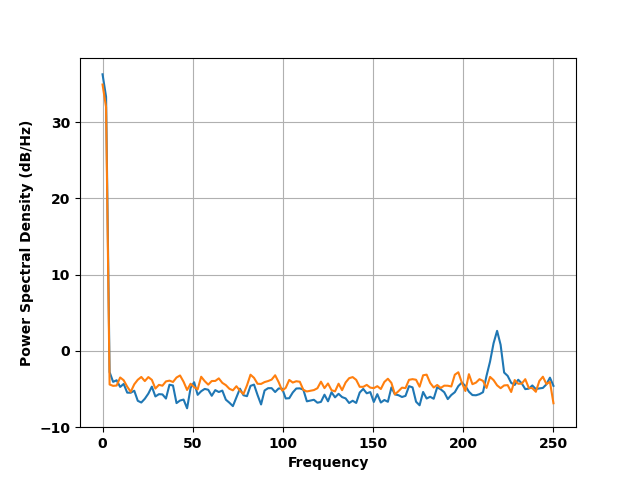

In [205]:
mt = corr_mov[:,np.argmax(meanImage)]
mt = (mt)*(200/256)
nt = np.random.poisson(lam=np.mean(mt-(20*200/256)), size=mt.shape)
f,a = plt.subplots()
a.psd(mt, Fs=500);
a.psd(nt, Fs=500);
print(np.var(mt)/np.mean(mt))
print(np.var(nt)/np.mean(nt))

In [102]:
bead_mov = io.imread(r"H:\Urs_data\20230626_bead_samples\500vol_per_s_300mV_bead_stack.tif")

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


154


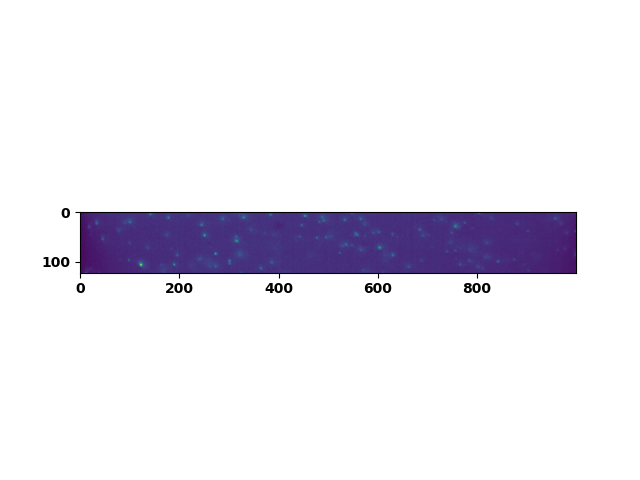

In [129]:
bead_plane = np.copy(bead_mov[3::16,:,:])
bead_plane = bead_plane[100:,:,:]
f,a = plt.subplots()
a.imshow(np.mean((bead_plane.astype(np.float64)-20)*200/256,axis=0))
print(np.max(bead_plane))
# a.hist(bead_plane.flatten(), np.arange(0,256));

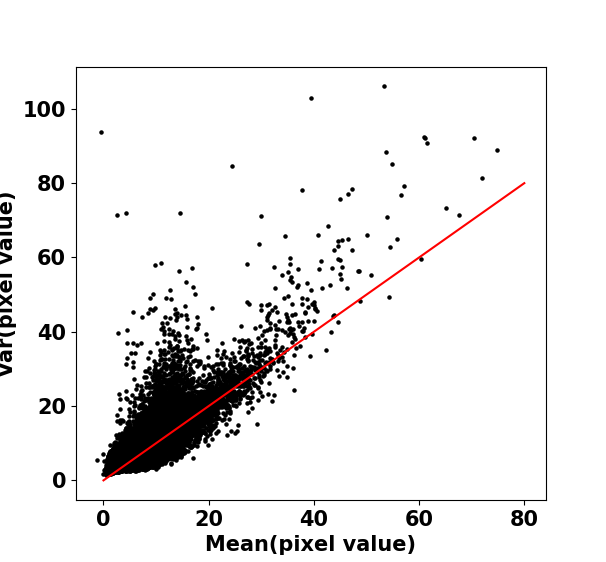

In [139]:
cm = 1/2.54  # centimeters in inches
f,a = plt.subplots(figsize=(15.4*cm, 14.3*cm))
# a.scatter(np.mean((mov.astype(np.float32)-20)*200/256, 0), np.var((mov.astype(np.float32)-20)*200/256, 0), s=3, c='gray', label='uncorrected')
a.scatter(np.mean((bead_plane.astype(np.float64)-20)*200/256, 0).flatten(),
          np.var((bead_plane.astype(np.float64)-20)*200/256, 0).flatten(), s=5, label='corrected', c='k')
a.plot([0, 80], [0, 80], c='r')
# a.set_yscale('log')
a.set_ylabel('Var(pixel value)')
a.set_xlabel('Mean(pixel value)')
a.xaxis.label.set_size(15)
a.tick_params(axis='x', labelsize=15)
a.yaxis.label.set_size(15)
a.tick_params(axis='y', labelsize=15)

In [149]:
for n in range(16):
    io.imsave(r"H:\Urs_data\20230626_bead_samples\bead_stack\rec01_plane_"+ str(n).zfill(2) + '.tif', bead_mov[n::16,:,:])

In [151]:
import pickle
with open(r"H:\Urs_data\20230626_bead_samples\bead_stack\glitches.pickle", 'rb') as f:
        dat = pickle.load(f)

In [153]:
planePks = dat[0]
glitchpks = dat[1]

In [159]:
planePks[0]

array([  50,   64,   88,  104,  127,  143,  166,  182,  205,  221,  244,
        260,  284,  299,  323,  338,  362,  377,  401,  417,  440,  456,
        479,  495,  518,  534,  557,  573,  597,  612,  636,  651,  675,
        691,  714,  730,  753,  769,  792,  808,  831,  847,  871,  886,
        910,  925,  949,  965,  988, 1004])

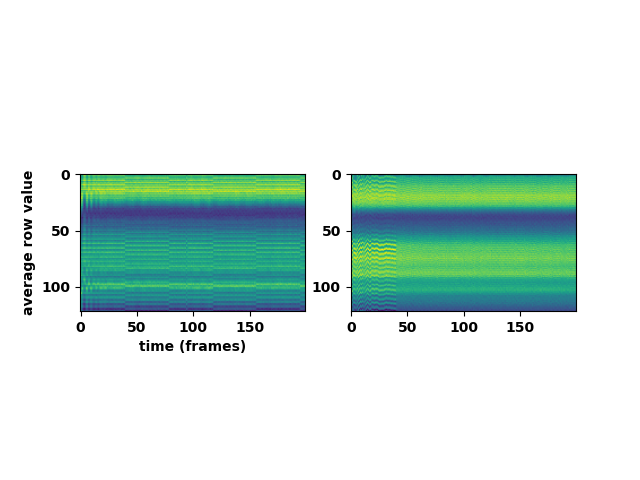

In [261]:
f,a = plt.subplots(1,2)
a[0].imshow(np.mean(np.reshape((mov)[:200,:], (200,122,-1)), 2).T, vmin=21, vmax=31)
a[0].set_xlabel('time (frames)')
a[0].set_ylabel('average row value')
a[1].imshow(np.mean(np.reshape((corr_mov)[:200,:], (200,122,-1)), 2).T, vmin=21, vmax=31)
# a.set_xlabel('time (frames)')
# a.set_ylabel('average row value')
# a[1].plot(np.mean(np.reshape((mov)[:200,:], (200,122,-1)), axis=(1,2)), np.arange(0,200))
# a[1].invert_yaxis()

Text(0, 0.5, 'average row value')

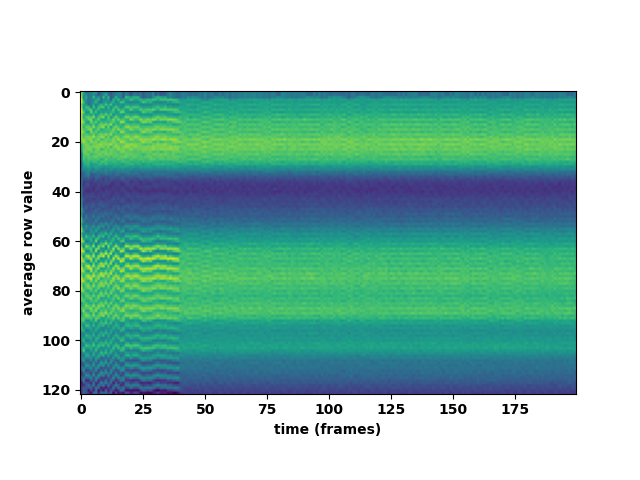

In [260]:
f,a = plt.subplots()
a.imshow(np.mean(np.reshape((corr_mov)[:200,:], (200,122,-1)), 2).T)
a.set_xlabel('time (frames)')
a.set_ylabel('average row value')
# a[1].plot(np.mean(np.reshape((mov)[:200,:], (200,122,-1)), axis=(1,2)), np.arange(0,200))
# a[1].invert_yaxis()

In [265]:
# compare simple average on normal vs SUPPORT denoised data
masks = io.imread(r"Y:\hpc\rw\user\urs\20230418_rec06\orig_mask_stack.tif")

In [270]:
corr_mov = io.imread(r"Y:\hpc\rw\user\urs\20230418_rec06\rec06_plane_01_expcorr_motion_corrected_hp.tif")

In [271]:
support_mov = io.imread(r"Y:\hpc\rw\user\urs\20230418_rec06\rec06_plane_01_expcorr_motion_corrected_hp_denoised.tif")

In [274]:
corr_mov = np.reshape(corr_mov, (corr_mov.shape[0], -1))
support_mov = np.reshape(support_mov, (support_mov.shape[0], -1))

In [304]:
xax = np.arange(0, corr_mov.shape[0]/500, 1/500)

tr_corr_mov = []
tr_support_mov = []

for n in range(1,4):
    msk = np.ravel(masks[1,:,:]==n)
    tr_corr_mov.append(-np.mean(corr_mov[:,msk], 1))
    tr_support_mov.append(-np.mean(support_mov[:,msk], 1))

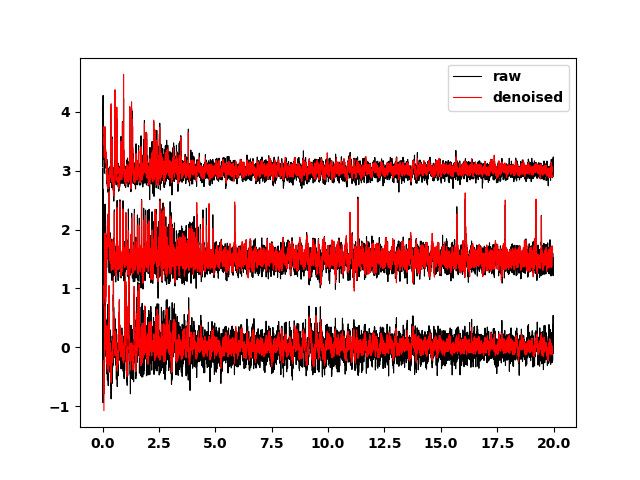

In [310]:
f, a = plt.subplots()
for n in range(len(tr_corr_mov)):
    l1, = a.plot(xax, 1.5*n + tr_corr_mov[n]/np.mean(np.sort(tr_corr_mov[n][250:])[-10:]), c='k', linewidth=.8)
    l2, = a.plot(xax[30:-30], (1.5*n + tr_support_mov[n]/np.mean(np.sort(tr_support_mov[n][250:])[-10:])), c='r', linewidth=.8)
    if n == 0:
        l1.set_label('raw')
        l2.set_label('denoised')
    # a.plot(xax[30:-30], (10*n + -tr_support_mov[n]/np.std(tr_support_mov[n])), c='r', linewidth=.8)
    # a.plot(xax, 10*n + -tr_corr_mov[n]/np.std(tr_corr_mov[n]), c='k', linewidth=.8)
    # a.plot(xax, 10*n + -tr_corr_mov[n], c='k', linewidth=.8)
    # a.plot(xax[30:-30], (10*n + -tr_support_mov[n]), c='r', linewidth=.8)
    a.legend()
    
    

In [303]:
(np.sort(tr_support_mov[n][250:]))

array([-4.9614253, -3.549277 , -3.3058925, ...,  0.8865541,  0.9061107,
        0.9398106], dtype=float32)

MovieWriter Pillow unavailable; using Pillow instead.


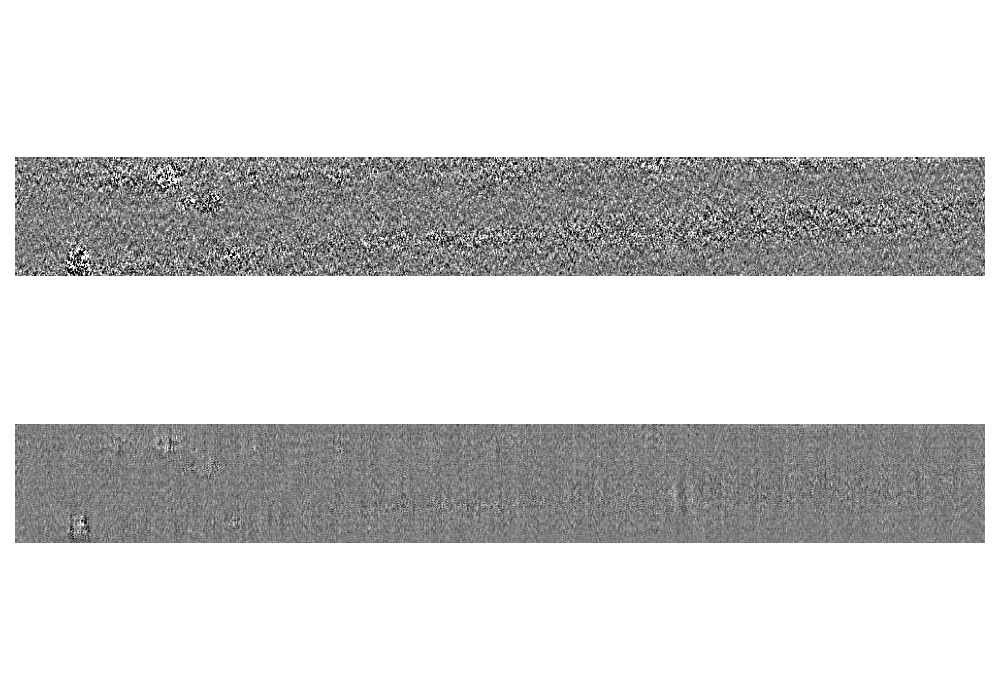

In [326]:
f,a = plt.subplots(2,1, figsize=(10,7))
# , figsize=(13,10)
minmax = 5
im1 = a[0].imshow(np.reshape(corr_mov[0+250+30,:], (122, -1)), cmap='gray', vmin=-minmax, vmax=minmax)
a[0].axis('off')
im2 = a[1].imshow(np.reshape(support_mov[0+250,:], (122, -1)), cmap='gray', vmin=-minmax, vmax=minmax)
a[1].axis('off')
plt.tight_layout()

def init():
    im1.set_data(np.reshape(corr_mov[0+250+30,:], (122, -1)))
    im2.set_data(np.reshape(support_mov[0+250,:], (122, -1)))
    return im1, im2
def animate(i):
    im1.set_data(np.reshape(corr_mov[i+250+30,:], (122, -1)))
    im2.set_data(np.reshape(support_mov[i+250,:], (122, -1)))
    return im, line
            
anim = FuncAnimation(f, animate, init_func=init,
                               frames=200, interval=20, blit=True, repeat = False)
anim.save(r'H:\Urs_data\20230418_fish_PTZ\compare_corr_hp_vs_densoised_rec06_plane00_20230418.gif', writer='Pillow')
# a.imshow(np.reshape(support_mov[0,:], (122, -1)))

In [318]:
support_mov.shape

(9939, 122000)

In [2]:
sig = np.load(r"H:\Urs_data\20230418_fish_PTZ\data0005.npz")

0.040865785597862234


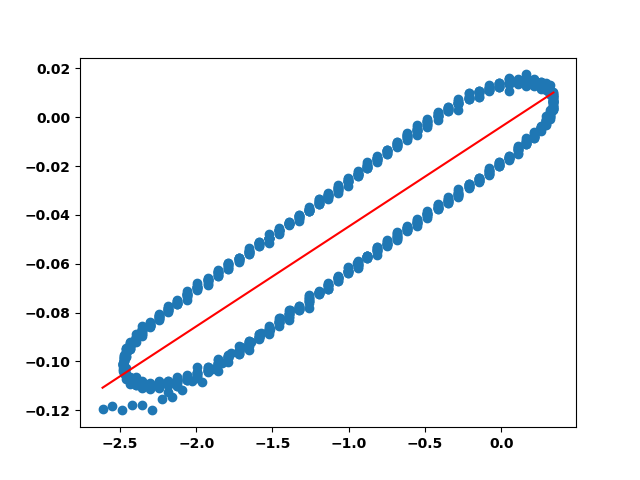

In [60]:
galvo_out = sig['analogData'][:,2][:1000]
galvo_drive = sig['analogData'][:,4][:1000]
# galvo_out = np.reshape(galvo_out, (-1,50))
# galvo_drive = np.reshape(galvo_drive, (-1,50))
# print(np.shape(galvo_out))
f,a = plt.subplots()
# a.plot(galvo_out.T);
# a.scatter(galvo_out[1::2,:], galvo_drive[1::2,:])
a.scatter(galvo_drive, galvo_out)
m,b = np.polyfit(galvo_drive,galvo_out,1)
a.plot([np.min(galvo_drive), np.max(galvo_drive)], [np.min(galvo_drive)*m+b, np.max(galvo_drive)*m+b], c='r') 
print(m)
# for n in range(5):
#     a.plot(sig['analogData'][:,n][:1000])
# tt = np.array([0,1,2,3,4,5,4,3,2,1,0,1,2,3,4,5,4,3,2,1])
# print(np.reshape(tt, (-1,5)))

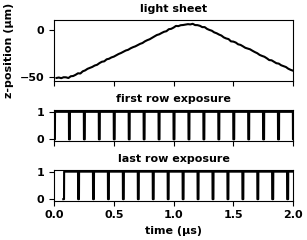

In [90]:
%matplotlib widget
cm = 1/2.54  # centimeters in inches
f, a = plt.subplots(3,1, sharex=True, figsize=(7.8*cm, 6.1*cm), gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': [2,1,1],
                           'wspace': 0,
                           'hspace': 0}, layout="constrained")
for n in range(2,3):
    tmpsig = sig['analogData'][sig['analogData'][:,0]<0.01,n]
    tmpsig = tmpsig*17.3/m
    # tmpsig = (tmpsig-np.min(tmpsig))/np.max((tmpsig-np.min(tmpsig)))
    a[0].plot(sig['analogData'][sig['analogData'][:,0]<0.01,0]*1000, tmpsig, label='light sheet', c='k');
    a[0].set_ylabel('z-position (μm)')
a[1].plot(sig['digitalData'][sig['digitalData'][:,0]<0.01,0]*1000, sig['digitalData'][sig['digitalData'][:,0]<0.01,1], label='first row exposure', c='k');
a[2].plot((sig['digitalData'][sig['digitalData'][:,0]<0.01,0]+0.625e-6*122)*1000, sig['digitalData'][sig['digitalData'][:,0]<0.01,1], label='last row exposure', c='k');
a[0].set_xlim((0,2))
a[0].set_title('light sheet', fontsize=8)
a[1].set_title('first row exposure', fontsize=8)
a[2].set_title('last row exposure', fontsize=8)
# a[0].legend(fontsize=8)
# a[1].legend(fontsize=8)
# a[2].legend(fontsize=8)
a[2].set_xlabel('time (ms)')
for ax in a:
    ax.xaxis.label.set_size(8)
    ax.tick_params(axis='x', labelsize=8)
    ax.yaxis.label.set_size(8)
    ax.tick_params(axis='y', labelsize=8)
# plt.tight_layout()
f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\figS2_stiching_procedure\aq_signals.svg', format="svg")

4.60565681619816


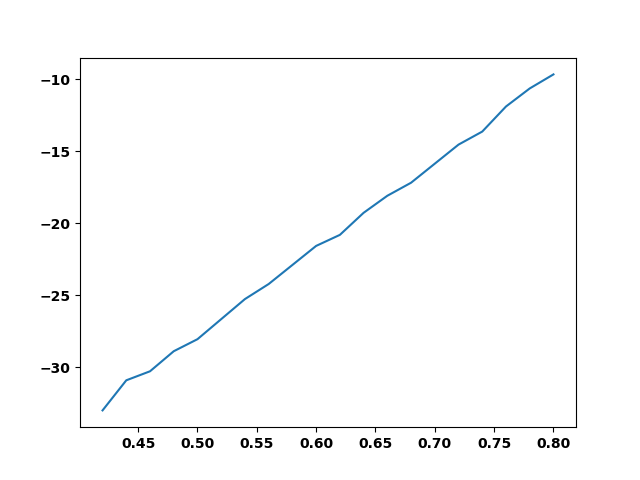

In [98]:
f,a = plt.subplots()
a.plot(sig['analogData'][20:40,0]*1000,tmpsig[20:40])
m,b = np.polyfit(sig['analogData'][20:40,0]*1000,tmpsig[20:40],1)
print(m*(0.625e-6*122*1000))

48.853099710552776


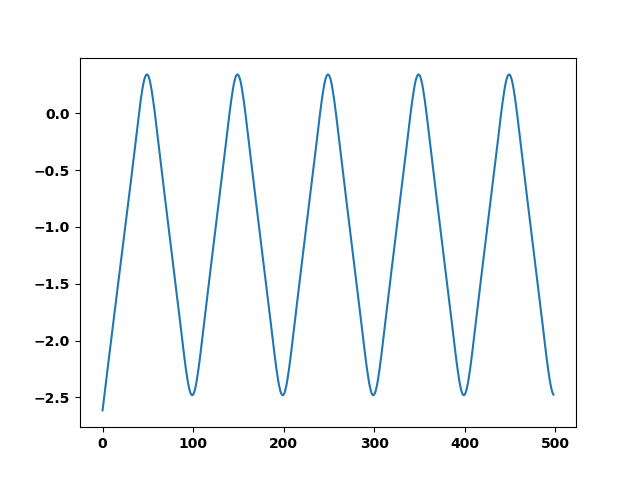

In [10]:
f,a=plt.subplots()
tmpsig = sig['analogData'][sig['analogData'][:,0]<0.01,4]
a.plot(tmpsig)
print((np.max(tmpsig[100:]) - np.min(tmpsig[100:]))*17.3)

In [77]:
from skimage.measure import regionprops

In [78]:
props = regionprops(mask)

In [104]:
props[0].centroid + (props[0].axis_major_length,)
# (props[0].axis_major_length,)
# len(props)

(0.4401041666666667, 50.3671875, 12.552083333333334, 19.75390941851875)

In [105]:
import csv

# open the file in the write mode
with open(r'Z:\User\Urs\centroids.csv', 'w', newline='') as f:
    # create the csv writer
    writer = csv.writer(f)

    # write a row to the csv file
    for p in props:
        writer.writerow(p.centroid + (p.axis_major_length,))

In [124]:
tt = '0.4401041666666667,50.3671875,12.552083333333334,19.75390941851875'
a, b, c, d = tt.split(',')
print(float(a), float(b), float(c), float(d))

0.4401041666666667 50.3671875 12.552083333333334 19.75390941851875


In [171]:
vals = []
for n, d in enumerate(dat):
    if d:
        tmp = d['spikes'][(d['spikes']>500) & (d['spikes']<2500)]
        # tmp = (tmp-np.min(tmp))/np.max(tmp-np.min(tmp))
        vals.append(tmp.tolist())
    else:
        vals.append([])
# vals = np.asarray(vals)
# vals = (vals-np.min(vals))/np.max(vals-np.min(vals))

# print(dat[0]['dFF'][:500]/np.std(dat[0]['dFF'][:500]), end='')

In [ ]:
vals = []
for n, d in enumerate(dat):
    if d:
        tmp = d['dFF'][500:600]/np.std(d['dFF'][500:600])
        # tmp = (tmp-np.min(tmp))/np.max(tmp-np.min(tmp))
        vals.append(tmp.tolist())
    else:
        vals.append(np.zeros(100).tolist())
vals = np.asarray(vals)
vals = (vals-np.min(vals))/np.max(vals-np.min(vals))

In [177]:
# print(vals.tolist(), end='')
# print(vals, end='')
timestring = '{:.2f} s'
from time import sleep
for n in range(10):
    sleep(.5)
    print(timestring.format(n/3), end='\r')

In [179]:
tuple(map(lambda x: np.uint64(x), (122 * 1000, 9999)))

(122000, 9999)

In [180]:
filename = r"Y:\hpc\rw\user\urs\20230418_rec09\rec09_plane_03_expcorr_rig__d1_122_d2_1000_d3_1_order_F_frames_9999.mmap"
mov = np.memmap(filename, mode='r', shape=(1000*122, 9999), dtype=np.float32, order='F')

In [181]:
tmov.shape

(122000, 9999)

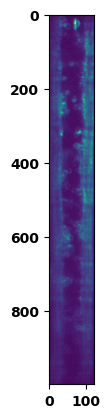

In [183]:
f, a = plt.subplots()
a.imshow(np.reshape(tmov[:,100], (1000, 122)))

In [62]:
dat[0]['weights'].shape

(16, 1000, 122)

In [71]:
projimg = io.imread(r"Y:\hpc\rw\user\urs\20230425_fish_PTZ\rec01\rec01_plane_00_expcorr_proj.tif")

In [73]:
projimg.shape

(200, 244)

Text(0.5, 0.98, 'mean ΔF per row')

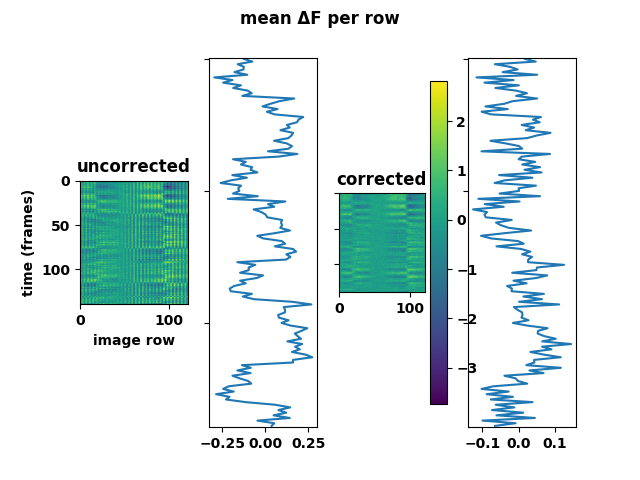

In [141]:
plt.close('all')
f, a = plt.subplots(1,4,sharey=True)
# f.subplots_adjust(hspace=0.3)
# a.plot(projimg[:,0:122]-np.mean(projimg[:,0:122], axis=0));
dfim = projimg[60:,:]-np.mean(projimg[60:,:], axis=0)
a[0].imshow(dfim[:,0:122],vmin=np.min(dfim), vmax=np.max(dfim))
a[0].set_title('uncorrected')
a[0].set_xlabel('image row')
a[0].set_ylabel('time (frames)')
a[1].plot(np.mean(dfim[:,:122], axis=1), np.arange(0,140))
cs = a[2].imshow(dfim[:,122:],vmin=np.min(dfim), vmax=np.max(dfim))
a[2].set_title('corrected')
a[3].plot(np.mean(dfim[:,122:], axis=1), np.arange(0,140))
f.colorbar(cs,ax=a[2])
f.suptitle('mean ΔF per row')
# f.tight_layout()
# f.savefig(r'Z:\User\Urs\writing\rf_voltage_imaging\figures\figS4_exp_corr\exp_corr_w_cbar.svg', format="svg")

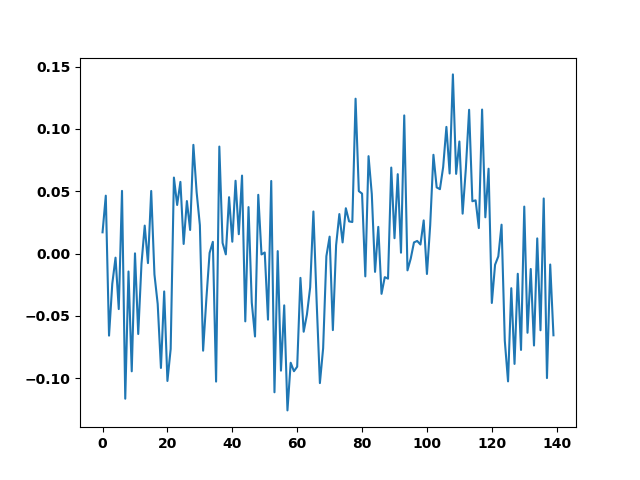

In [134]:
f, a = plt.subplots()
a.plot(np.mean(dfim[:,122:], axis=1))